# Testing neural networks approach to numerical integration on Genz numerical integration testing package

## Library import

In [1]:
%run ../skuld/skuld.py      # skuld NNI library
%run ../utils/plots.py      # plotting functions
%run ../utils/integrate.py  # 'classic' numerical integration function

In [37]:
def calculate_mae(results):
    absolute_errors = [abs(a - b) for a, b, _ in results]
    mae = sum(absolute_errors) / len(absolute_errors)
    return mae

# 1D testing

### 1D testing function

In [96]:
def test_1d_integration(h, func, func_float, a, b, func_name):
    u = random.uniform(0, 1)
    cs = random.uniform(0, 1)
    c = h
  
    X_init, y_init = generate_data(func, a, b, 40000, 1, u, c)
    plot_1d_function(X_init, y_init, func_name)
    X, y = scale_data(X_init, y_init)   

    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)  
    model = MLP(input_size, hidden_size)
    model.compile(criterion=nn.MSELoss(), optimizer=optim.Adam(model.parameters(), lr=learning_rate))
    train_history = model.train(x_train, y_train, num_epochs, verbose=False)
    test_loss = model.test(x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    nni_scaled = NeuralNumericalIntegration.integrate(model, a, b, n_dims=1)
    nni_result = descale_result(float(nni_scaled[0]), X_init, y_init, frange=(0, 1), n_dim=1)
    result_quad = integrate_1d_quad(func_float, a[0], b[0], u, c)
    result_trapz = np.trapz(y_init.squeeze().numpy(), X_init.squeeze().numpy())

    return nni_result, result_quad, result_trapz

## Hyperparams for 1D

In [97]:
input_size = 1
hidden_size = 100
learning_rate = 0.001
num_epochs = 5000

a = [0.0]
b = [1.0]

## 1. Oscillatory 1D

Iteration 1 is running!


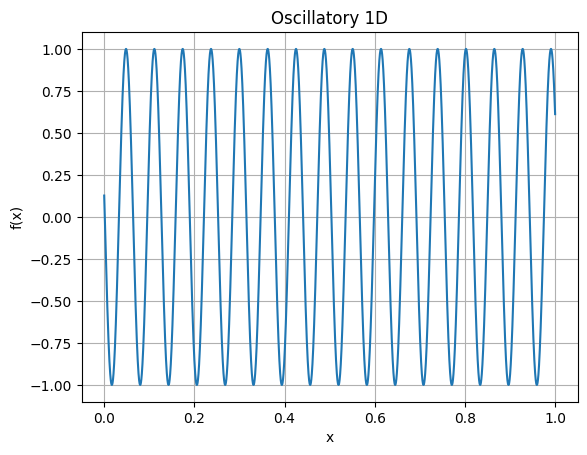

Training done! Time elapsed: 42.76 seconds
Test Loss: 0.1229332909
1D Integration started!
Iteration 2 is running!


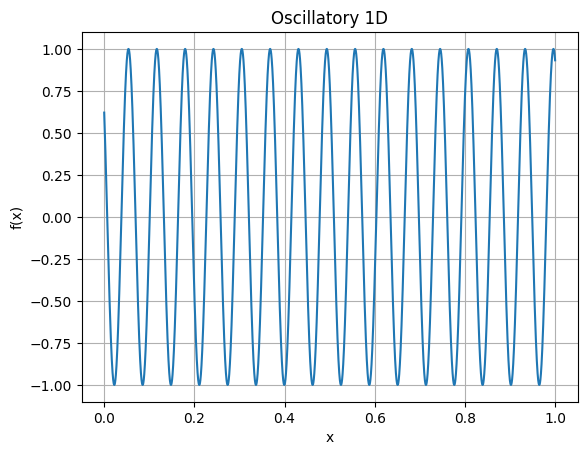

Training done! Time elapsed: 44.08 seconds
Test Loss: 0.1224732846
1D Integration started!
Iteration 3 is running!


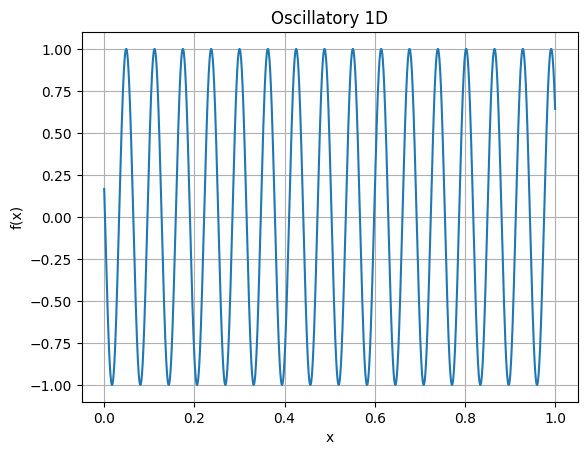

Training done! Time elapsed: 45.41 seconds
Test Loss: 0.1240885630
1D Integration started!
Iteration 4 is running!


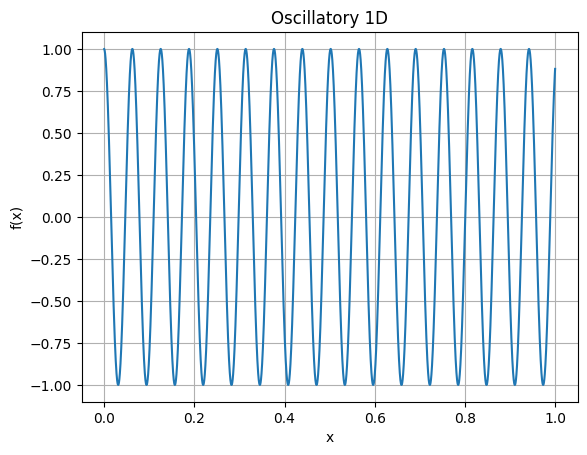

Training done! Time elapsed: 58.85 seconds
Test Loss: 0.1264584959
1D Integration started!
Iteration 5 is running!


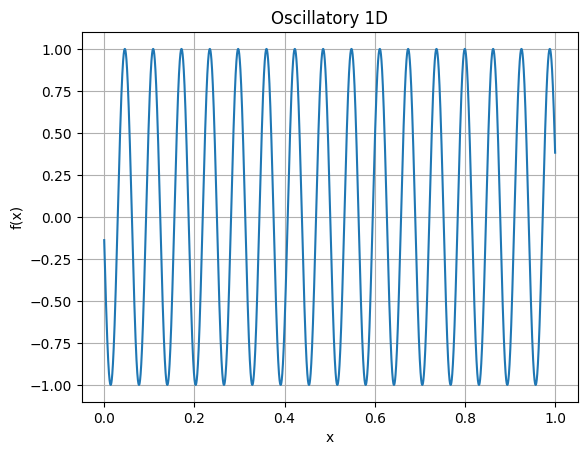

Training done! Time elapsed: 47.11 seconds
Test Loss: 0.1234706864
1D Integration started!
Iteration 6 is running!


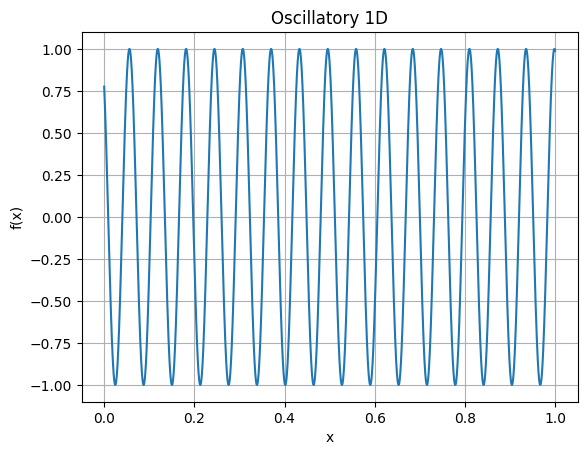

Training done! Time elapsed: 45.22 seconds
Test Loss: 0.1246143654
1D Integration started!
Iteration 7 is running!


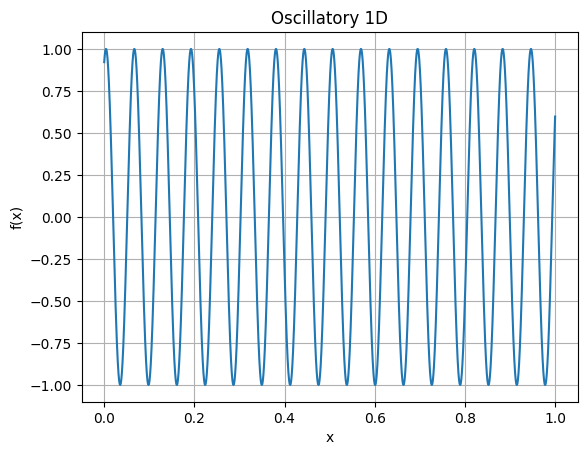

Training done! Time elapsed: 44.85 seconds
Test Loss: 0.1261103302
1D Integration started!
Iteration 8 is running!


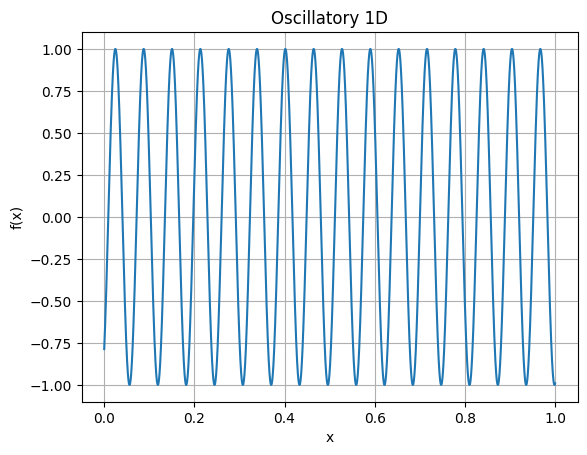

Training done! Time elapsed: 44.26 seconds
Test Loss: 0.1230691671
1D Integration started!
Iteration 9 is running!


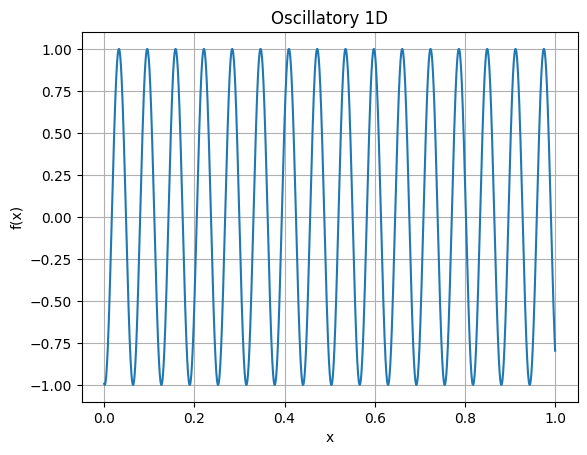

Training done! Time elapsed: 43.42 seconds
Test Loss: 0.1259417236
1D Integration started!
Iteration 10 is running!


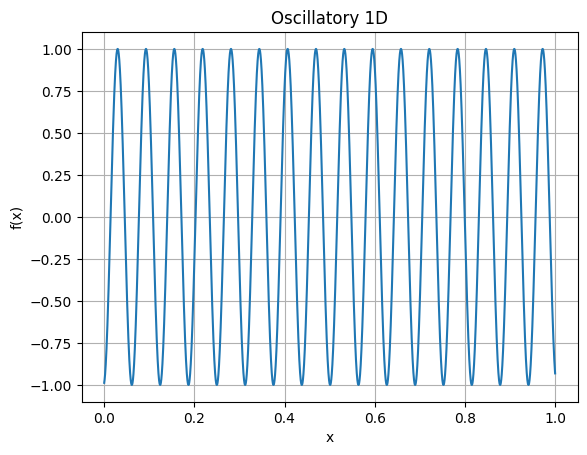

Training done! Time elapsed: 44.51 seconds
Test Loss: 0.1235928163
1D Integration started!


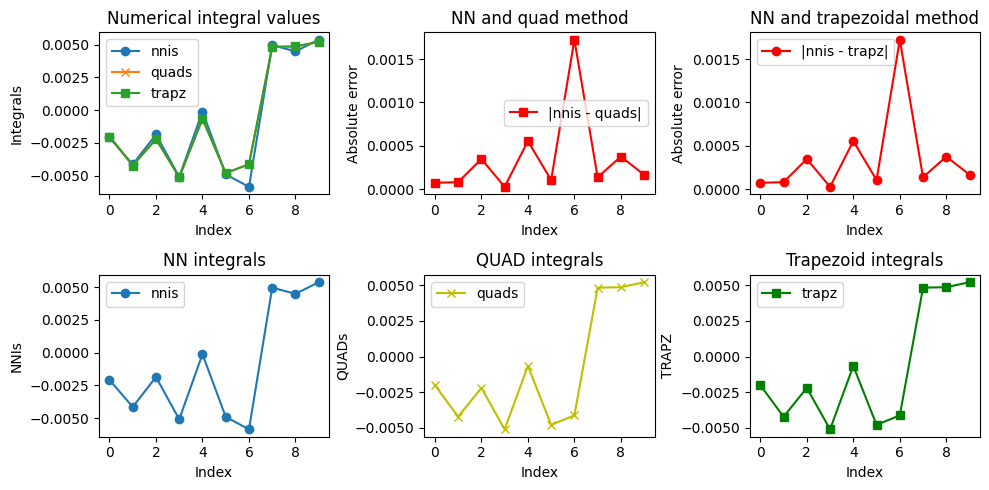

In [98]:
func_name = 'Oscillatory 1D'
h = 100
tests_num = 10
results = []

def osc_1d(X, u, c):
    return torch.cos(2 * math.pi * u + X * c)

def osc_1d_float(X, u, c):
    return math.cos(2 * math.pi * u + X * c)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results.append(test_1d_integration(h, osc_1d, osc_1d_float, a, b, func_name))

plot_test_results(results)

In [99]:
mae = calculate_mae(results)
mae

0.00035821305055866307

## 2. Product peak 1D

Iteration 1 is running!


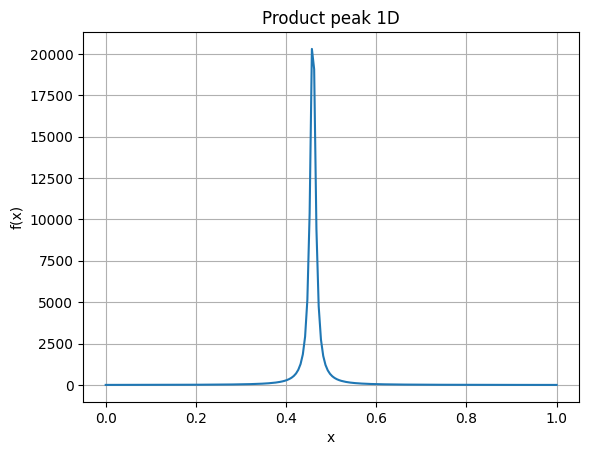

Training done! Time elapsed: 2.05 seconds
Test Loss: 0.0481282771
1D Integration started!
Iteration 2 is running!


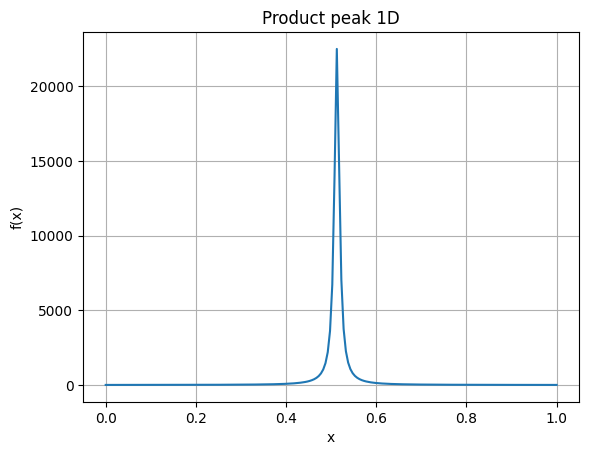

Training done! Time elapsed: 2.03 seconds
Test Loss: 0.0008265738
1D Integration started!
Iteration 3 is running!


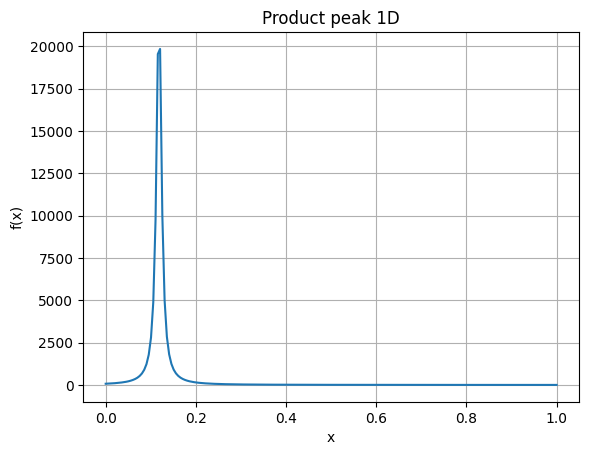

Training done! Time elapsed: 2.02 seconds
Test Loss: 0.0023334564
1D Integration started!
Iteration 4 is running!


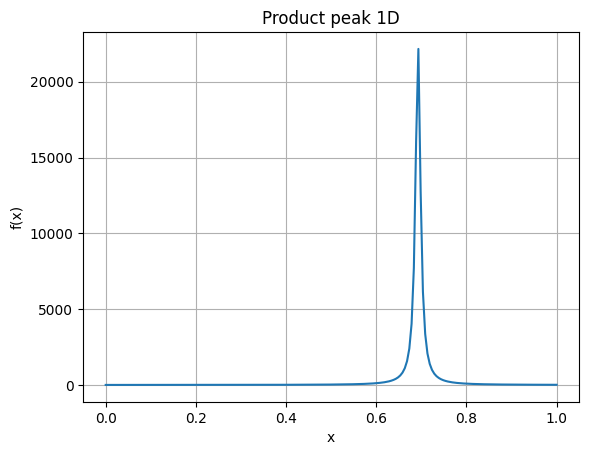

Training done! Time elapsed: 2.12 seconds
Test Loss: 0.0154119553
1D Integration started!
Iteration 5 is running!


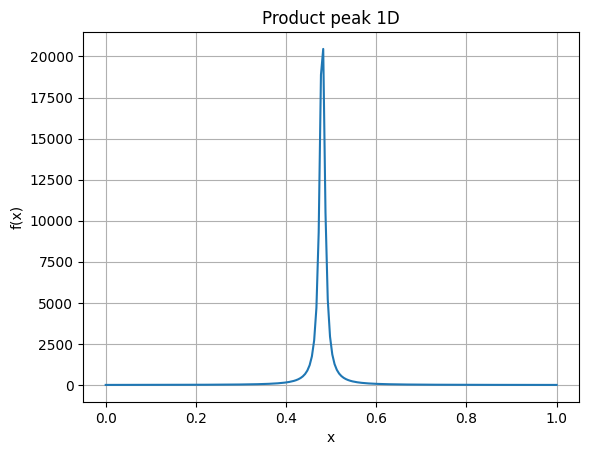

Training done! Time elapsed: 2.05 seconds
Test Loss: 0.0015416328
1D Integration started!
Iteration 6 is running!


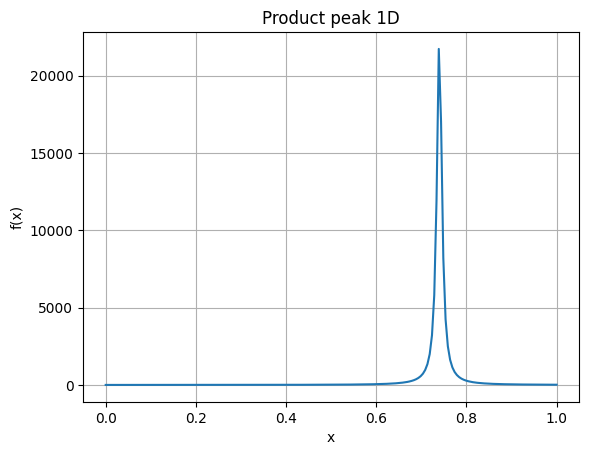

Training done! Time elapsed: 2.06 seconds
Test Loss: 0.0004841222
1D Integration started!
Iteration 7 is running!


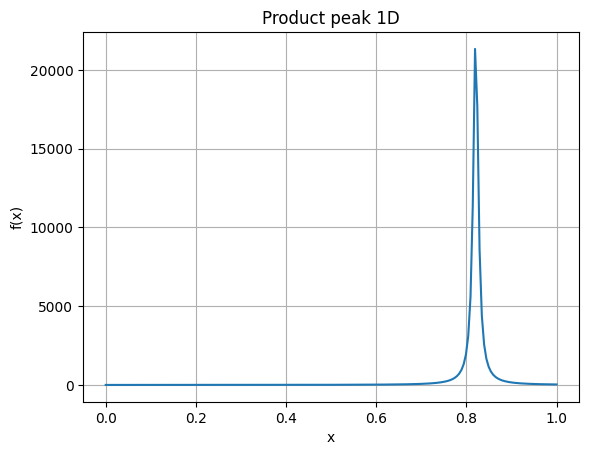

Training done! Time elapsed: 2.05 seconds
Test Loss: 0.0013520437
1D Integration started!
Iteration 8 is running!


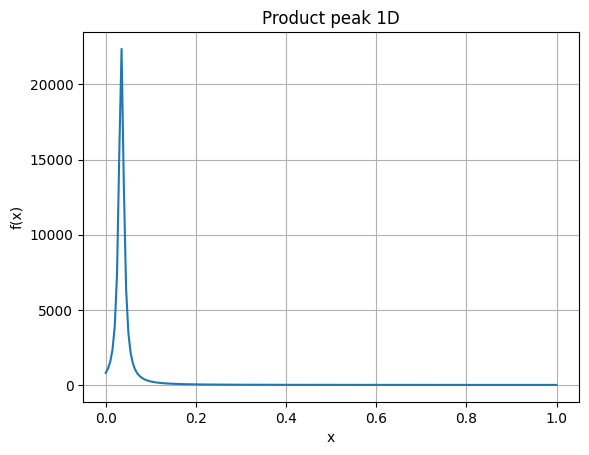

Training done! Time elapsed: 2.01 seconds
Test Loss: 0.0007310334
1D Integration started!
Iteration 9 is running!


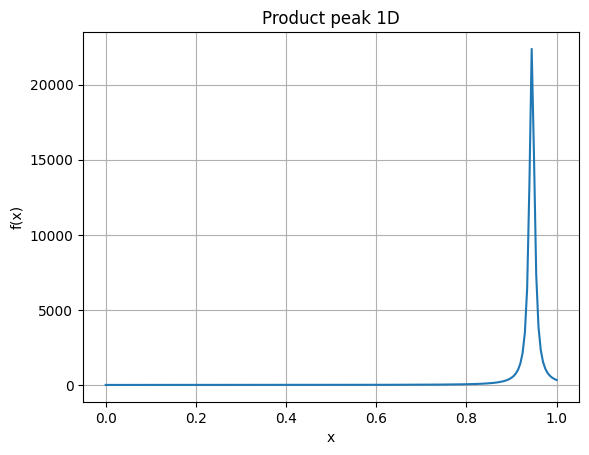

Training done! Time elapsed: 2.05 seconds
Test Loss: 0.0006416558
1D Integration started!
Iteration 10 is running!


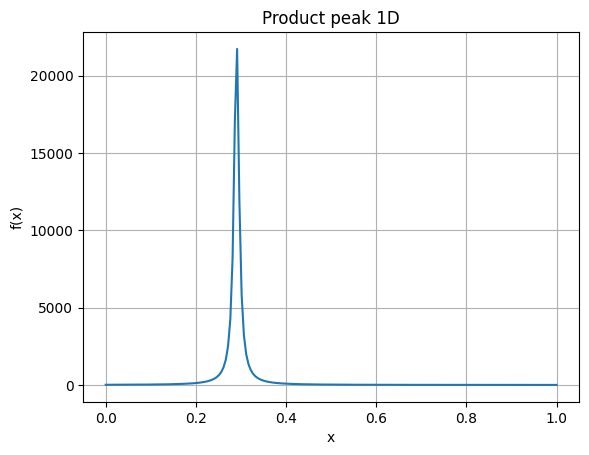

Training done! Time elapsed: 2.05 seconds
Test Loss: 0.0004383464
1D Integration started!


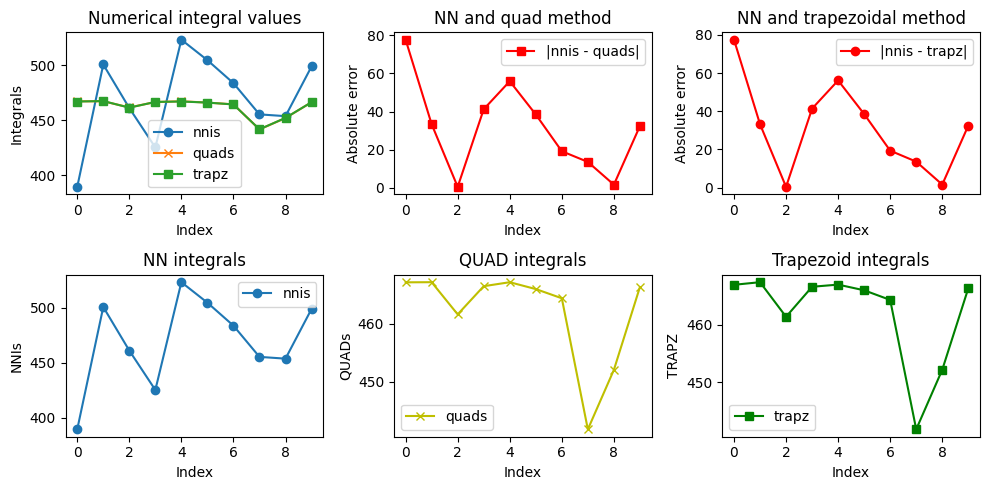

In [82]:
func_name = 'Product peak 1D'
h = 150
tests_num = 10
results2 = []

def prod_peak_1d(X, u, c):
    return 1 / (c**(-2) + (X - u)**2)

def prod_peak_1d_float(X, u, c):
    return 1 / (c**(-2) + (X - u)**2)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results2.append(test_1d_integration(h, prod_peak_1d, prod_peak_1d_float, a, b, func_name))

plot_test_results(results2)

**NOTE** Absolute error is bad because the values are scaled upwards approximately 100 times.

In [83]:
mae2 = calculate_mae(results2)
mae2

31.432111322062703

## 3. Corner peak 1D

Iteration 1 is running!


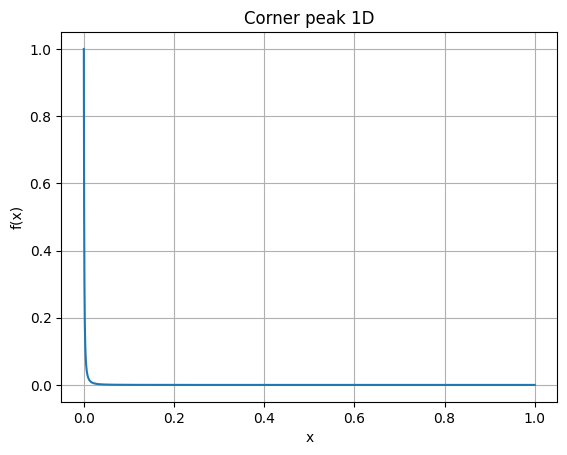

Training done! Time elapsed: 43.78 seconds
Test Loss: 0.0004560434
1D Integration started!
Iteration 2 is running!


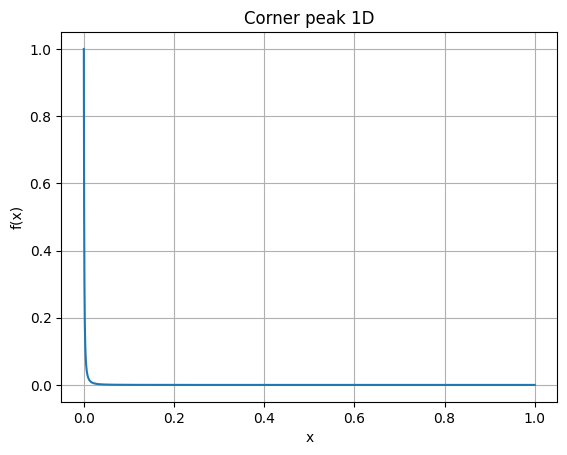

Training done! Time elapsed: 44.70 seconds
Test Loss: 0.0001740334
1D Integration started!
Iteration 3 is running!


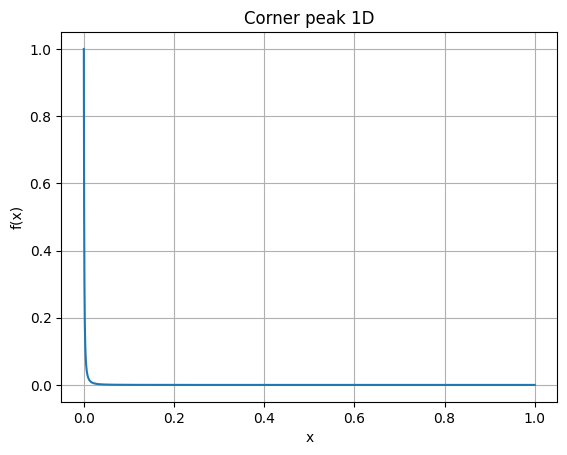

Training done! Time elapsed: 46.35 seconds
Test Loss: 0.0005476419
1D Integration started!


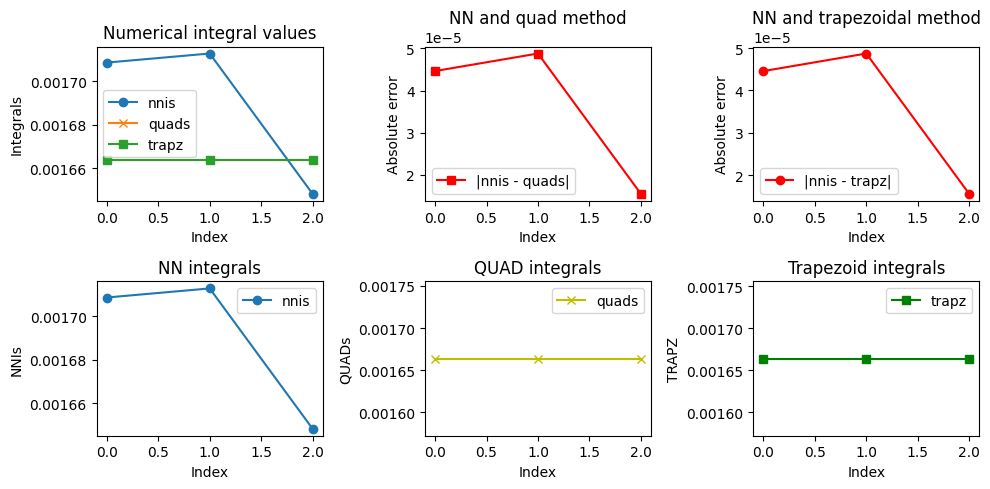

In [100]:
func_name = 'Corner peak 1D'
h = 600
tests_num = 3
results3 = []

def corn_peek_1d(X, u, c):
        return (1 + c * X) ** (-2)

def corn_peek_float(X, u, c):
        return (1 + c * X) ** (-2)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results3.append(test_1d_integration(h, corn_peek_1d, corn_peek_float, a, b, func_name))

plot_test_results(results3)

In [106]:
mae3 = calculate_mae(results3)
mae3


3.6306158253021636e-05

## 4. Gaussian 1D

Iteration 1 is running!


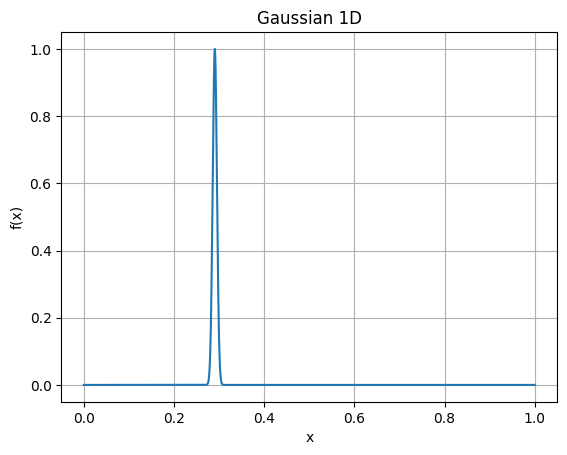

Training done! Time elapsed: 5.31 seconds
Test Loss: 0.0085178865
Iteration 2 is running!


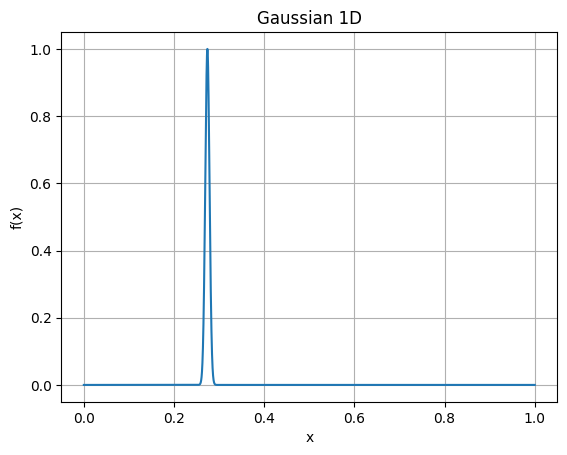

Training done! Time elapsed: 5.28 seconds
Test Loss: 0.0036489896
Iteration 3 is running!


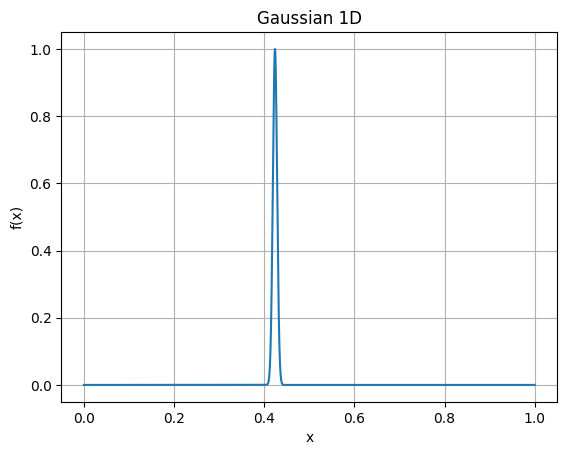

Training done! Time elapsed: 5.27 seconds
Test Loss: 0.0048355157
Iteration 4 is running!


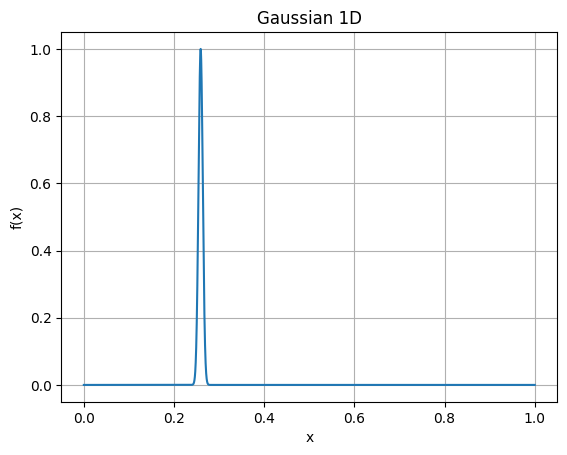

Training done! Time elapsed: 5.33 seconds
Test Loss: 0.0093894564
Iteration 5 is running!


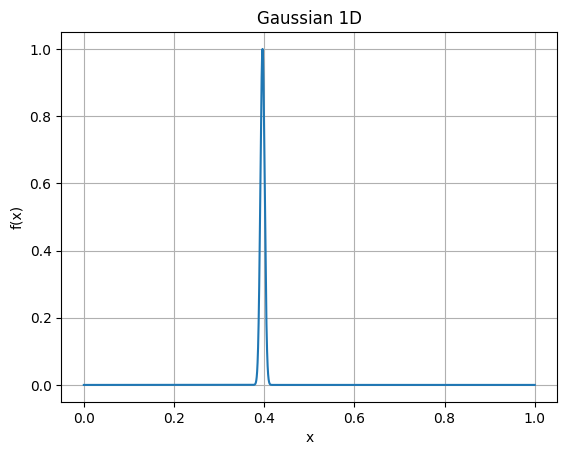

Training done! Time elapsed: 5.36 seconds
Test Loss: 0.0068917158
Iteration 6 is running!


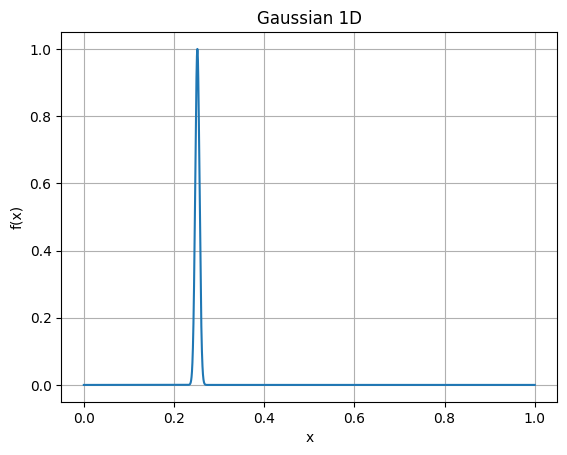

Training done! Time elapsed: 5.29 seconds
Test Loss: 0.0081173545
Iteration 7 is running!


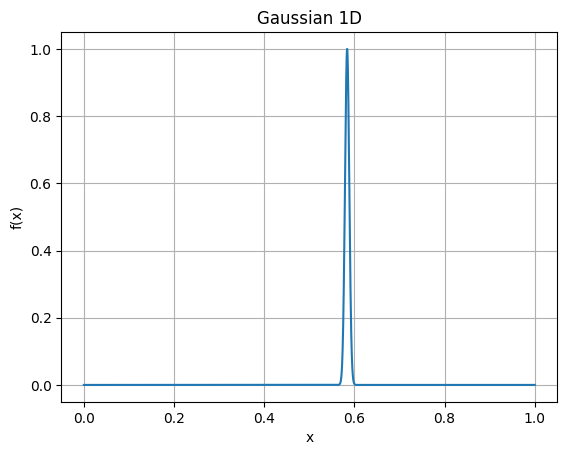

Training done! Time elapsed: 5.30 seconds
Test Loss: 0.0063834921
Iteration 8 is running!


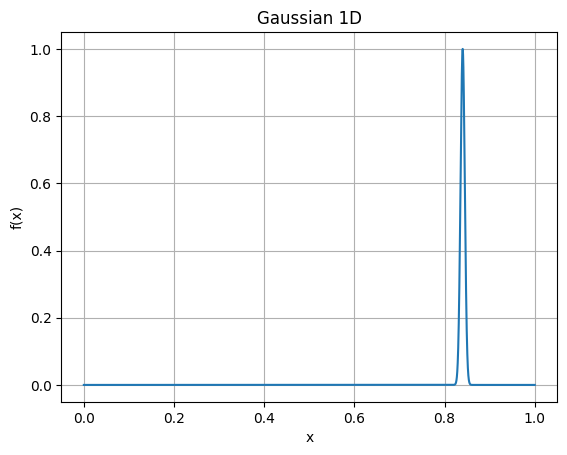

Training done! Time elapsed: 5.65 seconds
Test Loss: 0.0060008122
Iteration 9 is running!


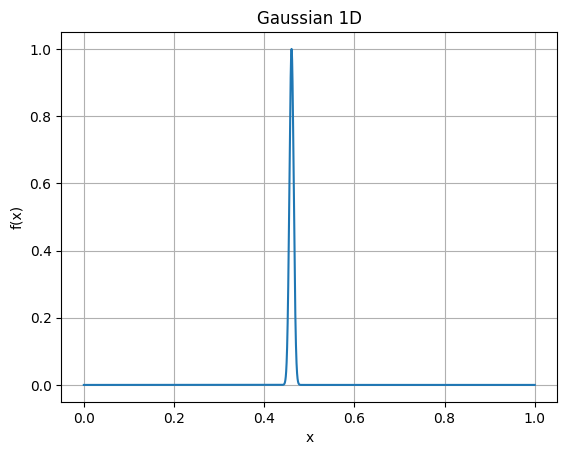

Training done! Time elapsed: 5.96 seconds
Test Loss: 0.0071307514
Iteration 10 is running!


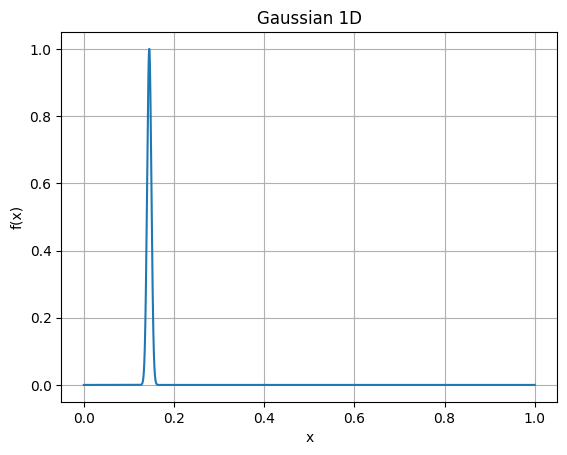

Training done! Time elapsed: 5.44 seconds
Test Loss: 0.0076551111


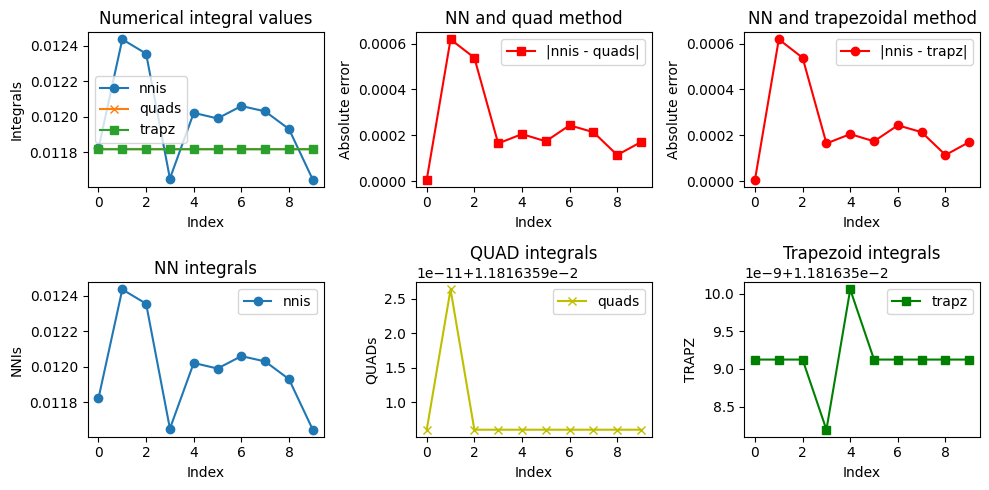

In [7]:
func_name = 'Gaussian 1D'
h = 150
tests_num = 10
results4 = []

def gauss_1d(X, u, c):
    return torch.exp(- c**2 * (X - u)**2)

def gauss_1d_float(X, u, c):
    return np.exp(- c**2 * (X - u)**2)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results4.append(test_1d_integration(h, gauss_1d, gauss_1d_float, a, b, func_name))

plot_test_results(results4)

## 5. Continuous 1D

Iteration 1 is running!


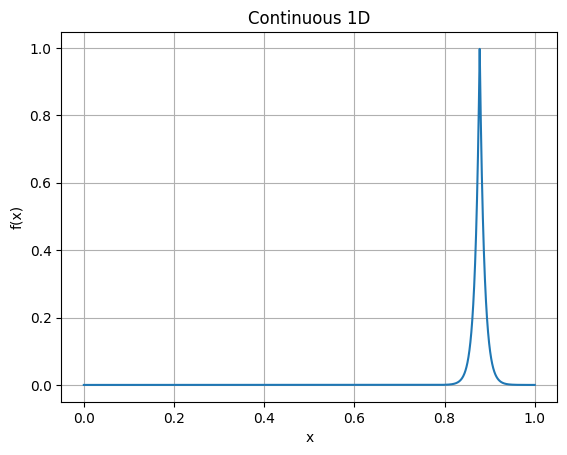

Training done! Time elapsed: 5.30 seconds
Test Loss: 0.0081456285
Iteration 2 is running!


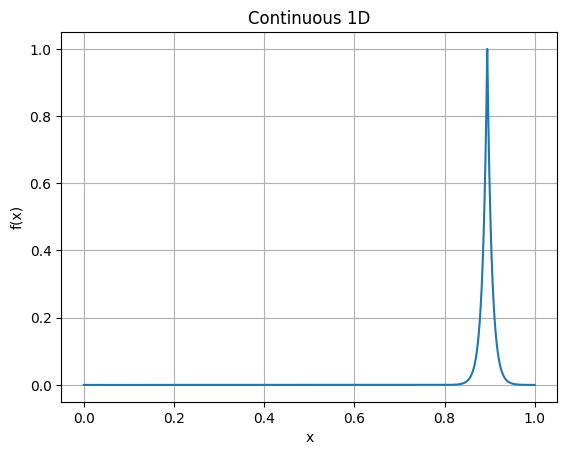

Training done! Time elapsed: 5.49 seconds
Test Loss: 0.0092050219
Iteration 3 is running!


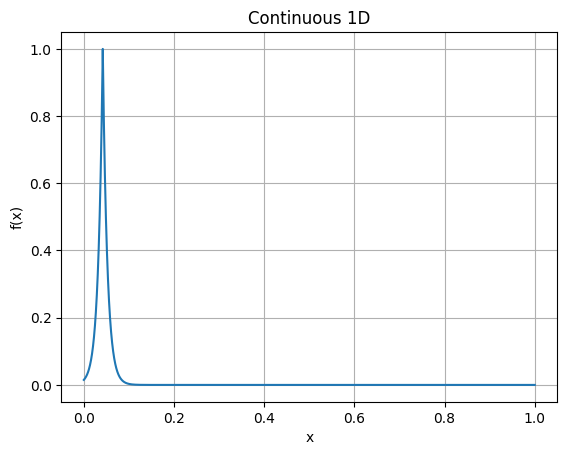

Training done! Time elapsed: 5.92 seconds
Test Loss: 0.0063569164
Iteration 4 is running!


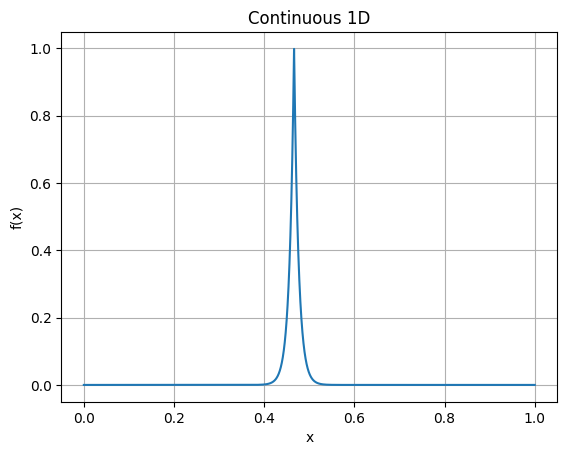

Training done! Time elapsed: 5.56 seconds
Test Loss: 0.0105543686
Iteration 5 is running!


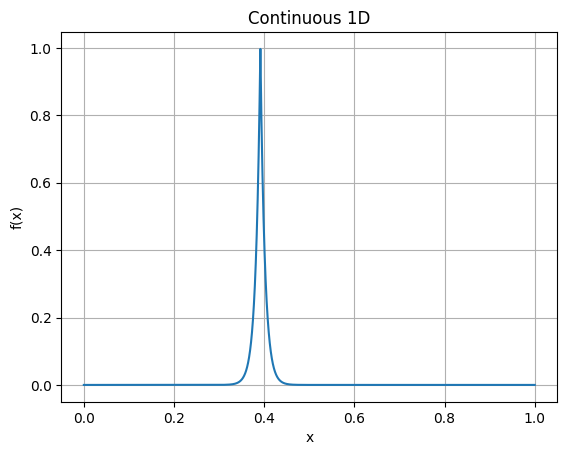

Training done! Time elapsed: 5.46 seconds
Test Loss: 0.0096348636
Iteration 6 is running!


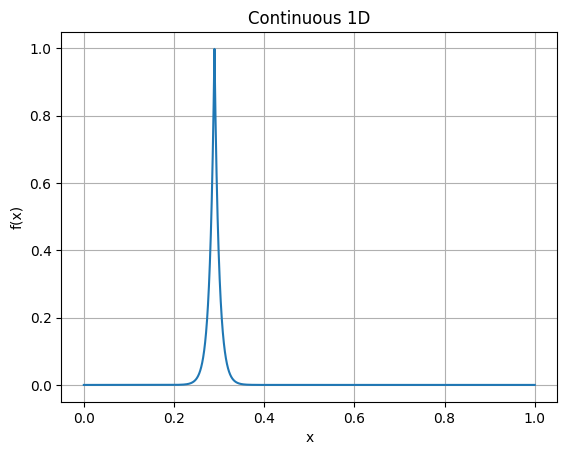

Training done! Time elapsed: 5.46 seconds
Test Loss: 0.0090643708
Iteration 7 is running!


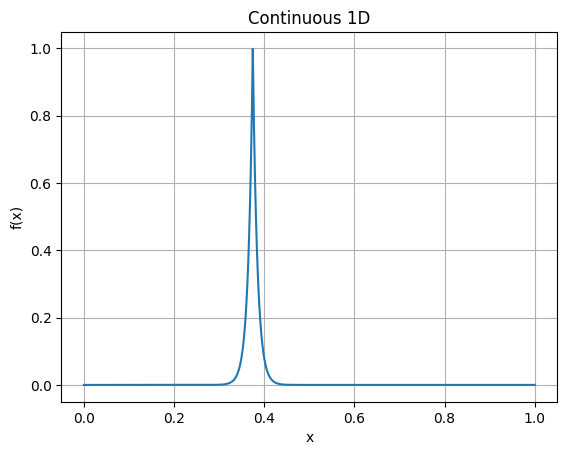

Training done! Time elapsed: 5.41 seconds
Test Loss: 0.0082201632
Iteration 8 is running!


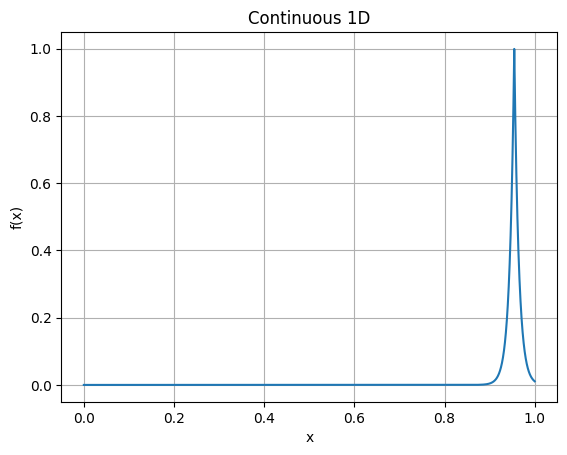

Training done! Time elapsed: 5.37 seconds
Test Loss: 0.0090901954
Iteration 9 is running!


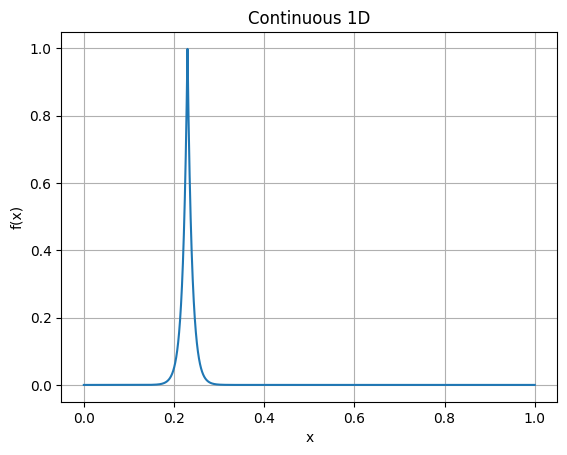

Training done! Time elapsed: 5.85 seconds
Test Loss: 0.0074596382
Iteration 10 is running!


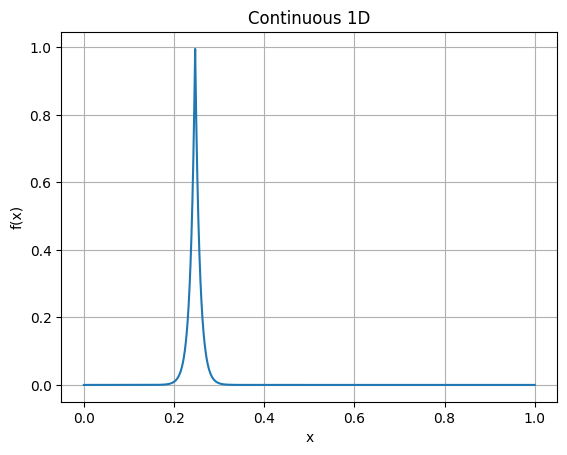

Training done! Time elapsed: 5.89 seconds
Test Loss: 0.0069614993


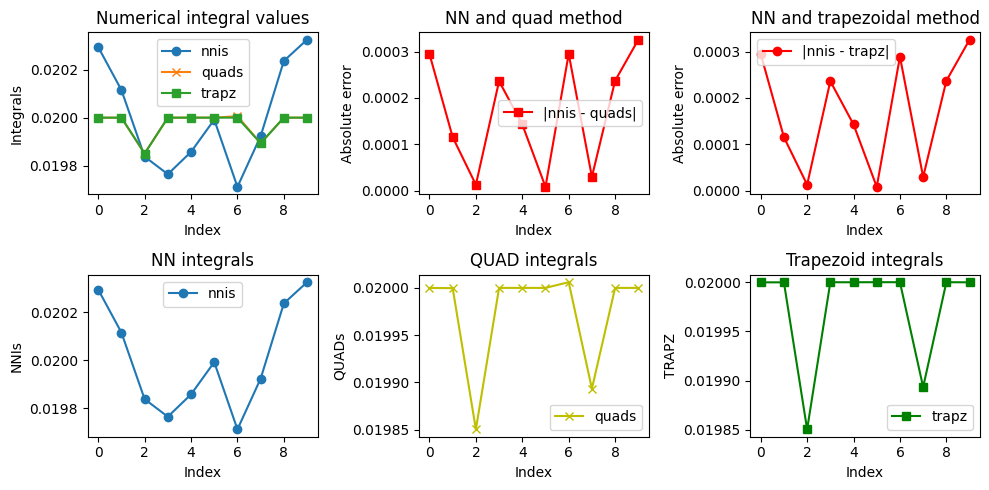

In [8]:
func_name = 'Continuous 1D'
h = 100
tests_num = 10
results5 = []

def cont_1d(X, u, c):
    return torch.exp(- c * abs(X - u))

def cont_1d_float(X, u, c):
    return np.exp(- c * abs(X - u))

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results5.append(test_1d_integration(h, cont_1d, cont_1d_float, a, b, func_name))

plot_test_results(results5)

## 6. Discontinuous 1D

Iteration 1 is running!


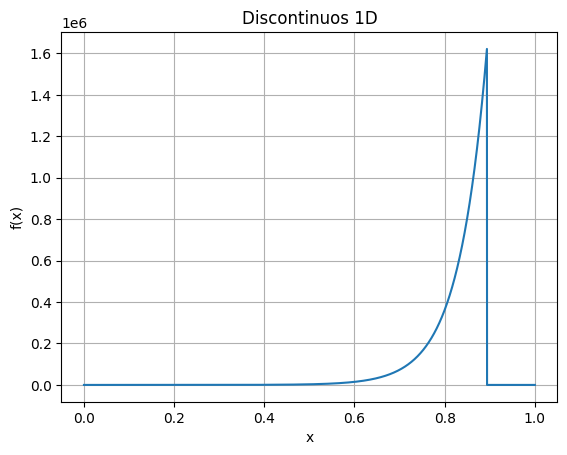

Training done! Time elapsed: 5.74 seconds
Test Loss: 0.0204498395
Iteration 2 is running!


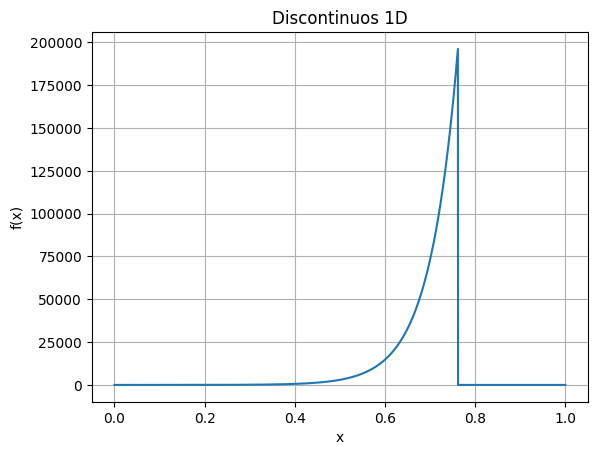

Training done! Time elapsed: 5.74 seconds
Test Loss: 0.0241857041
Iteration 3 is running!


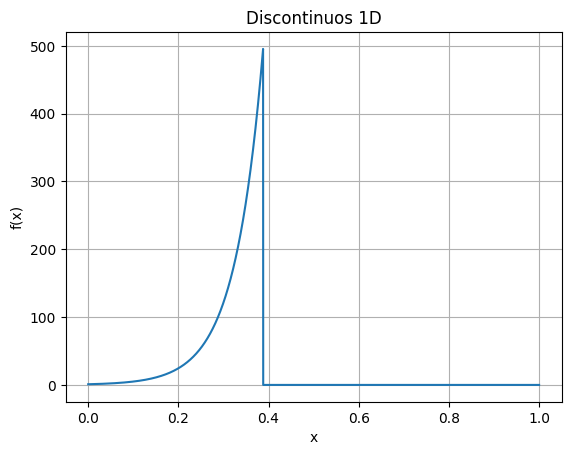

Training done! Time elapsed: 5.62 seconds
Test Loss: 0.0240732729
Iteration 4 is running!


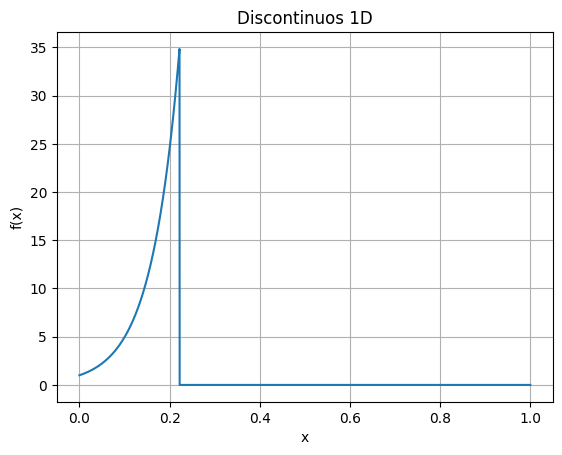

Training done! Time elapsed: 6.29 seconds
Test Loss: 0.0219454169
Iteration 5 is running!


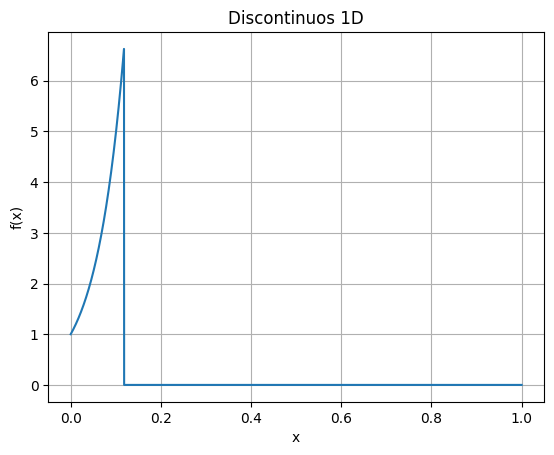

Training done! Time elapsed: 5.66 seconds
Test Loss: 0.0167032424
Iteration 6 is running!


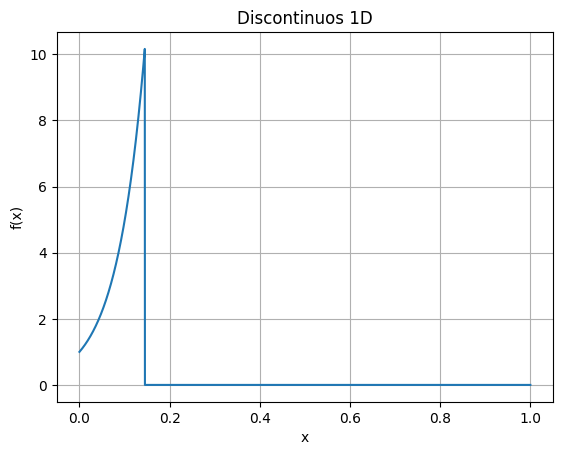

Training done! Time elapsed: 5.57 seconds
Test Loss: 0.0212652478
Iteration 7 is running!


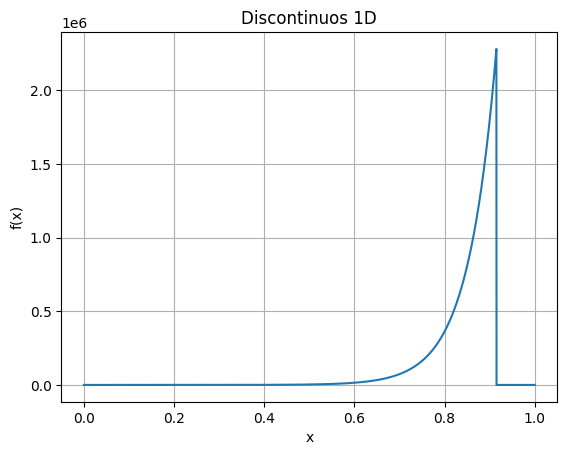

Training done! Time elapsed: 5.46 seconds
Test Loss: 0.0170797724
Iteration 8 is running!


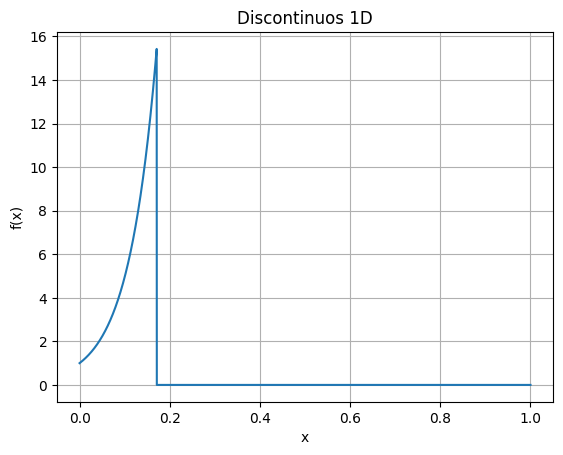

Training done! Time elapsed: 5.47 seconds
Test Loss: 0.0258654132
Iteration 9 is running!


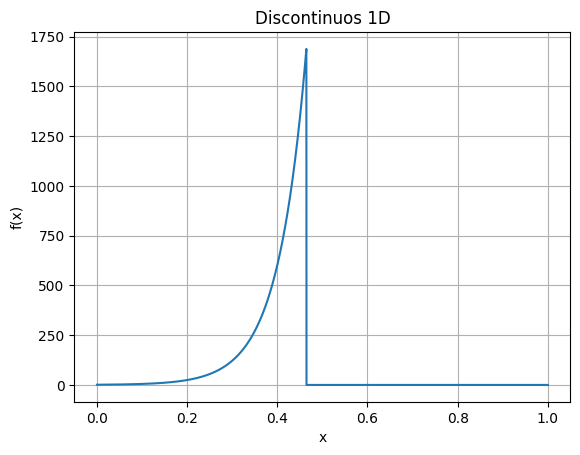

Training done! Time elapsed: 5.29 seconds
Test Loss: 0.0250013005
Iteration 10 is running!


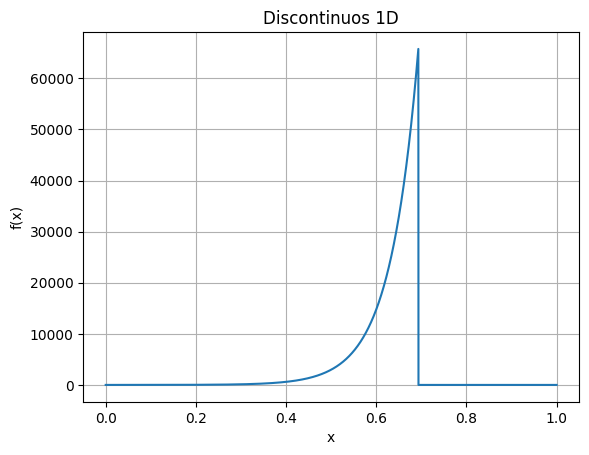

Training done! Time elapsed: 5.52 seconds
Test Loss: 0.0155490767


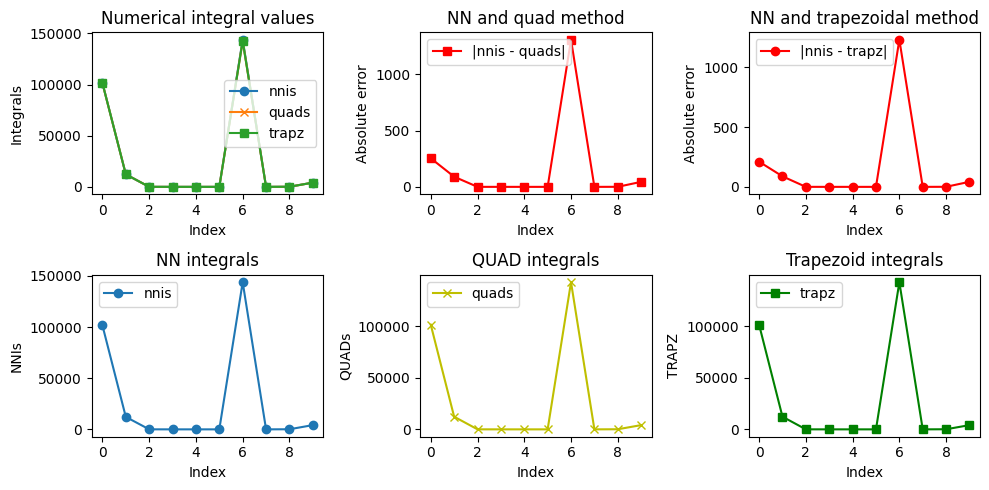

In [9]:
func_name = 'Discontinuos 1D'
h = 16
tests_num = 10
results6 = []

def disk_1d(X, u, c):
    y_list = []

    for x in X:
        if x > u:
            y_list.append(0)
        else:
            y_list.append(math.exp(c * x))
        
    return torch.tensor(y_list)

def disk_1d_float(X, u, c):
    if X > u:
        return 0
    else:
        return math.exp(c * X)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results6.append(test_1d_integration(h, disk_1d, disk_1d_float, a, b, func_name))

plot_test_results(results6)

# 2D Testing

## 2D testing function

In [55]:
def test_2d_integration(h, ej, func, func_float, a, b, func_name, logplot=False):
    u = [random.uniform(0, 1) for _ in range(input_size)]
    cs = [random.uniform(0, 1) for _ in range(input_size)]
    fraction = h / (input_size ** ej * sum(cs))
    c = [fraction * value for value in cs]
  
    X_init, y_init = generate_data(func, a, b, 200, input_size, u, c)
    if logplot:
        plot_2d_function_heatmap_with_log(X_init, y_init, func_name)
    else:
        plot_2d_function_heatmap(X_init, y_init, func_name)
    X, y = scale_data(X_init, y_init, n_dim=2)
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.1)  
    model = MLP(input_size, hidden_size)
    model.compile(criterion=nn.MSELoss(), optimizer=optim.Adam(model.parameters(), lr=learning_rate))
    train_history = model.train(x_train, y_train, num_epochs, verbose=False)
    test_loss = model.test(x_test, y_test)
    print(f"Test Loss: {test_loss:.10f}")
    
    nni_scaled = NeuralNumericalIntegration.integrate(model, a, b, n_dims=2)
    nni_result = descale_result(float(nni_scaled[0]), X_init, y_init, frange=(0, 1), n_dim=2)
    result_quad = integrate_2d_nquad(func_float, a, b, u, c)
    result_trapz = integrate_2d_trapz(func, a, b, 100, u, c)
   
    return nni_result, result_quad, result_trapz

## Hyperparams for 2D

In [56]:
input_size = 2
hidden_size = 100
learning_rate = 0.001
num_epochs = 5000

tests_num = 20

a = [0.0, 0.0]
b = [1.0, 1.0]

## 7. Oscillatory 2D

Iteration 1 is running!


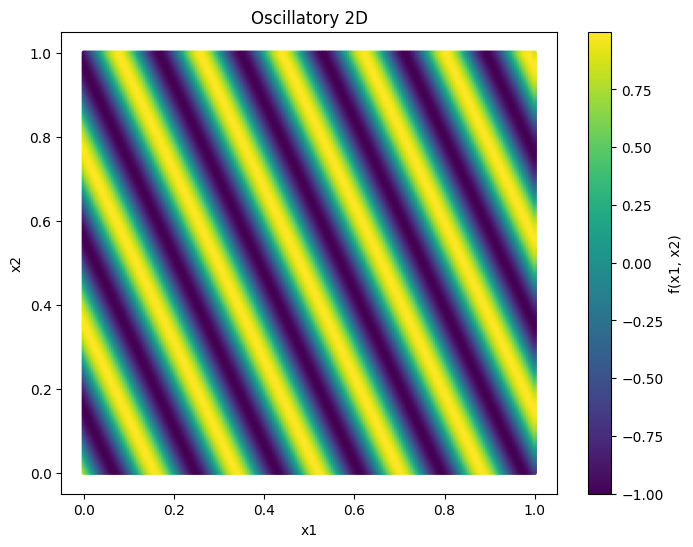

Training done! Time elapsed: 96.76 seconds
Test Loss: 0.1243874058
2D Integration started!
Iteration 2 is running!


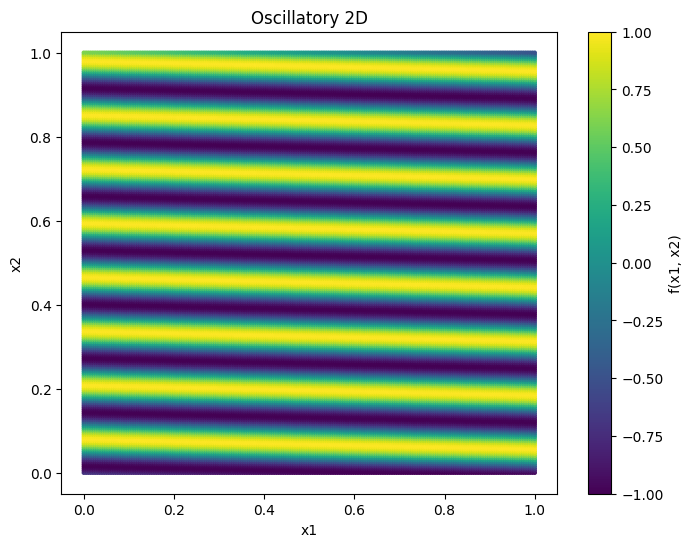

Training done! Time elapsed: 99.13 seconds
Test Loss: 0.1247203648
2D Integration started!
Iteration 3 is running!


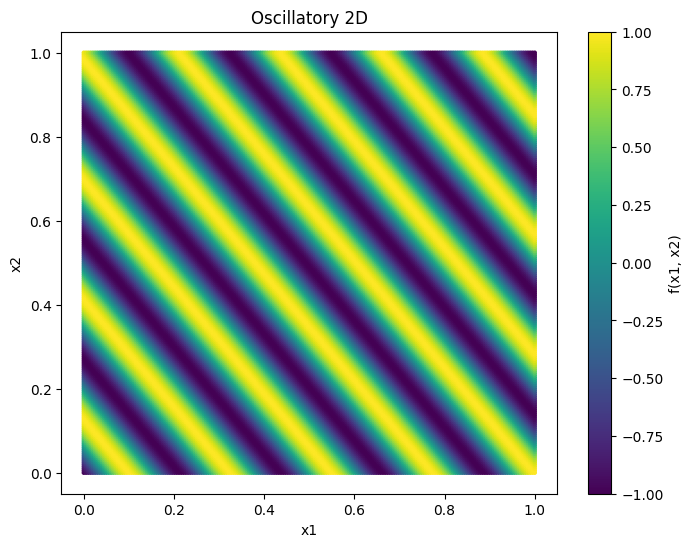

Training done! Time elapsed: 94.25 seconds
Test Loss: 0.1274773180
2D Integration started!
Iteration 4 is running!


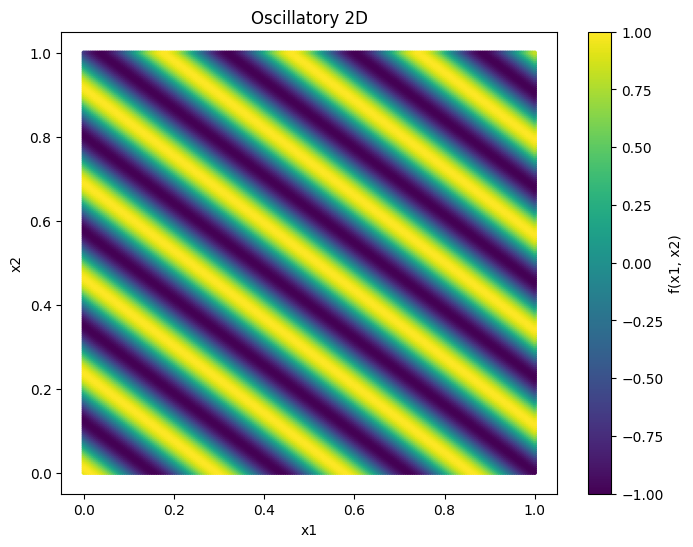

Training done! Time elapsed: 93.40 seconds
Test Loss: 0.1237316728
2D Integration started!
Iteration 5 is running!


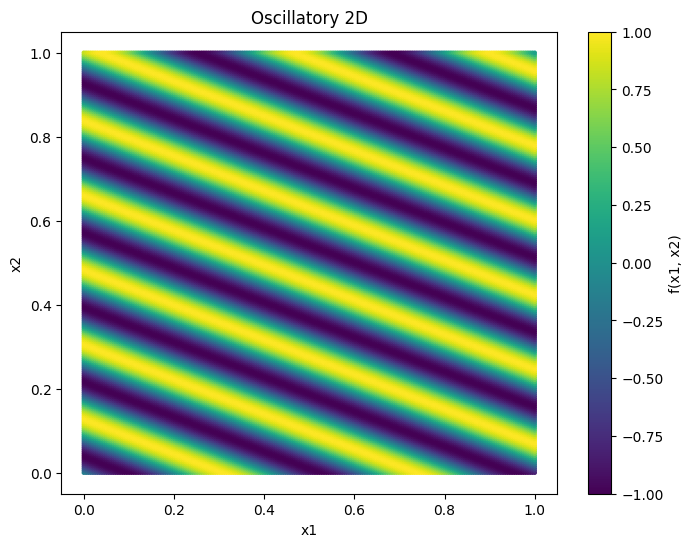

Training done! Time elapsed: 97.86 seconds
Test Loss: 0.1221839115
2D Integration started!


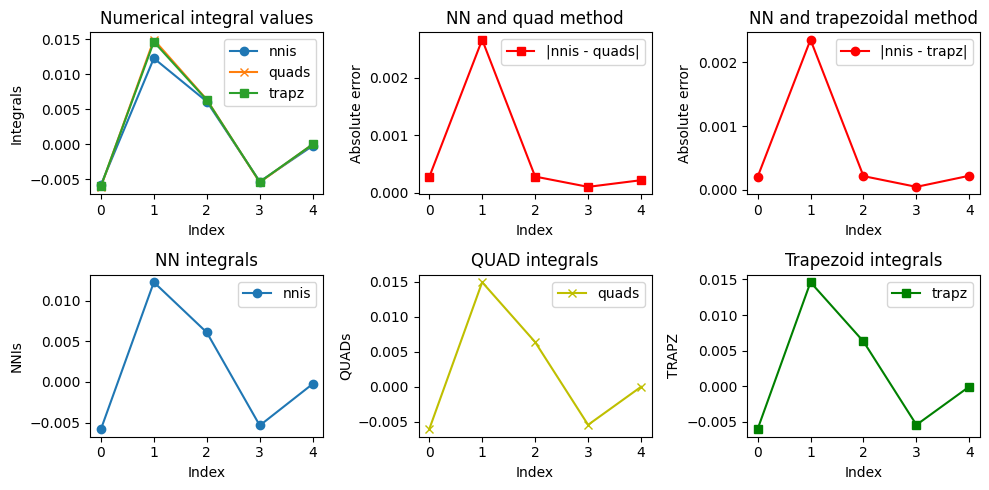

In [57]:
func_name = 'Oscillatory 2D'
h = 100
ej = 1
results7 = []

def osc_2d(X, u, c):
    sum_ = 0
    for i in range(input_size):
        sum_ += c[i] * X[:, i]

    return torch.cos(2 * math.pi * u[0] + sum_)
    
def osc_2d_float(X, u, c):
    sum_ = 0
    for i in range(input_size):
        sum_ += c[i] * X[i]
    return math.cos(2 * math.pi * u[0] + sum_)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results7.append(test_2d_integration(h, ej, osc_2d, osc_2d_float, a, b, func_name))

plot_test_results(results7)

In [58]:
results_list = [results7]
maes = [calculate_mae(results) for results in results_list]
maes

[0.0007089000732388537]

## 8. Product Peak 2D

Iteration 1 is running!


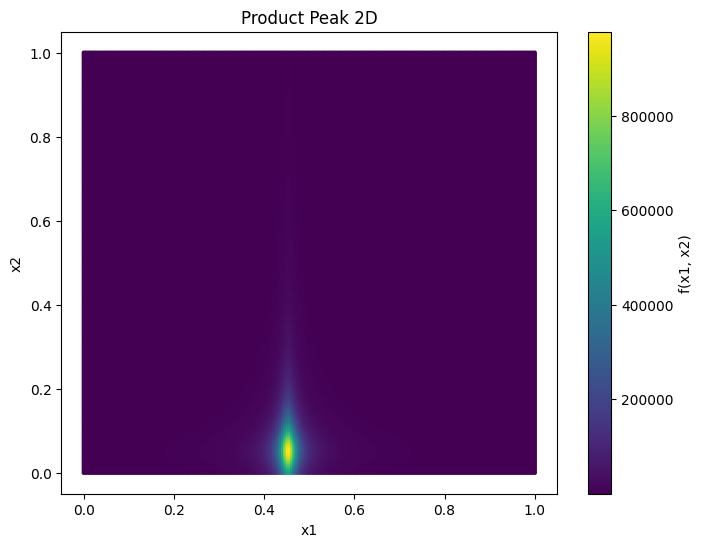

Training done! Time elapsed: 93.74 seconds
Test Loss: 0.0017138716
2D Integration started!
Iteration 2 is running!


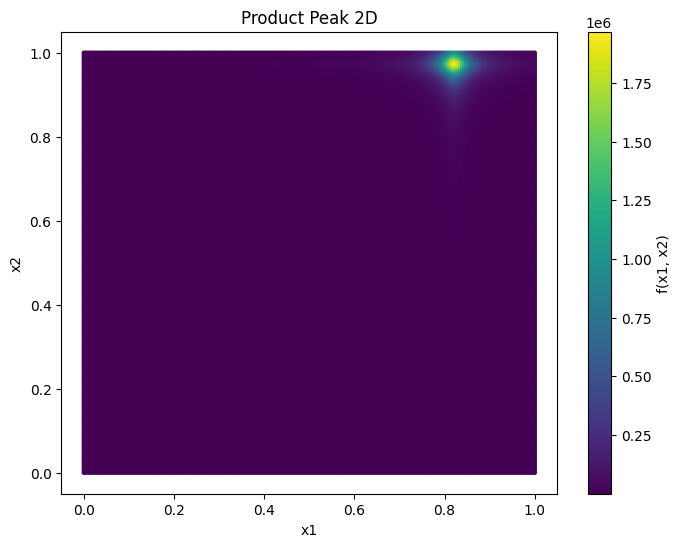

Training done! Time elapsed: 95.22 seconds
Test Loss: 0.0015981005
2D Integration started!
Iteration 3 is running!


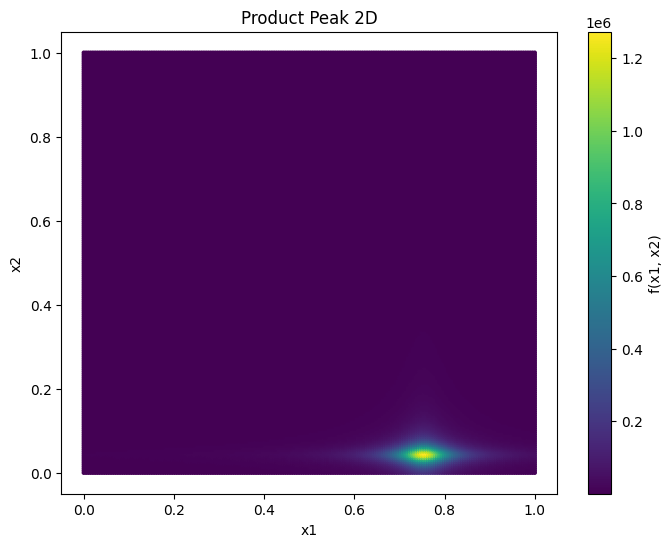

Training done! Time elapsed: 96.88 seconds
Test Loss: 0.0017531095
2D Integration started!


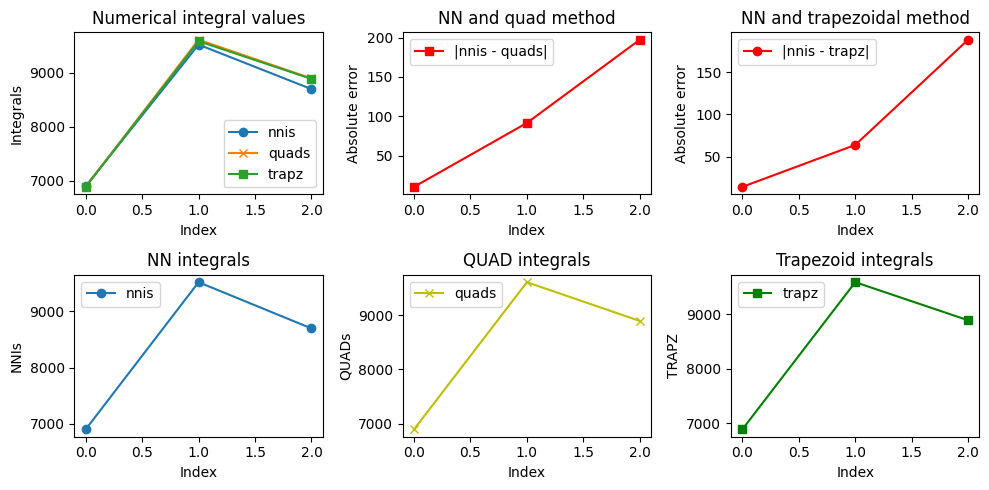

In [60]:
func_name = 'Product Peak 2D'
h = 150
ej = 1
results8 = []

def prod_peek_2d(X, u, c):
    prod_ = 1
    for i in range(2):
        prod_ *= (c[i] ** (-2) + (X[:, i] - u[i])**2) ** (-1)
    return prod_

def prod_peek_2d_float(X, u, c):
    prod_ = 1
    for i in range(2):
        prod_ *= (c[i] ** (-2) + (X[i] - u[i])**2) ** (-1)
    return prod_

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results8.append(test_2d_integration(h, ej, prod_peek_2d, prod_peek_2d_float, a, b, func_name, logplot=False))

plot_test_results(results8)

In [62]:
mae8 = calculate_mae(results8)
mae8

99.75148870037538

## 9. Corner Peak 2D

Iteration 1 is running!


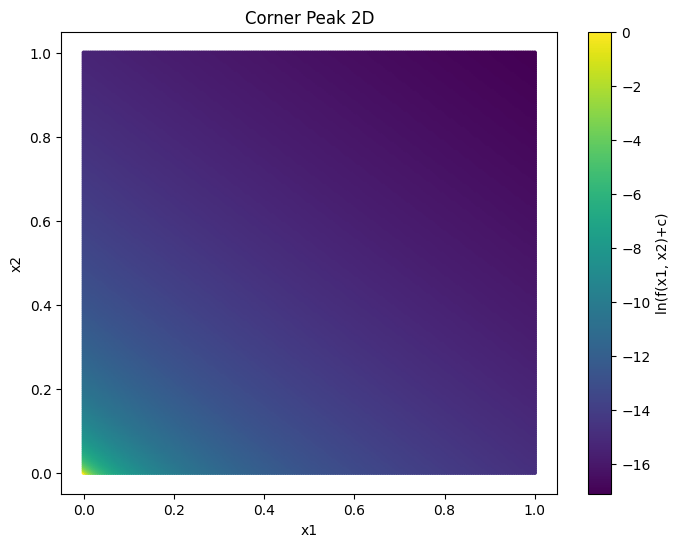

Training done! Time elapsed: 93.65 seconds
Test Loss: 0.0000009475
2D Integration started!
Iteration 2 is running!


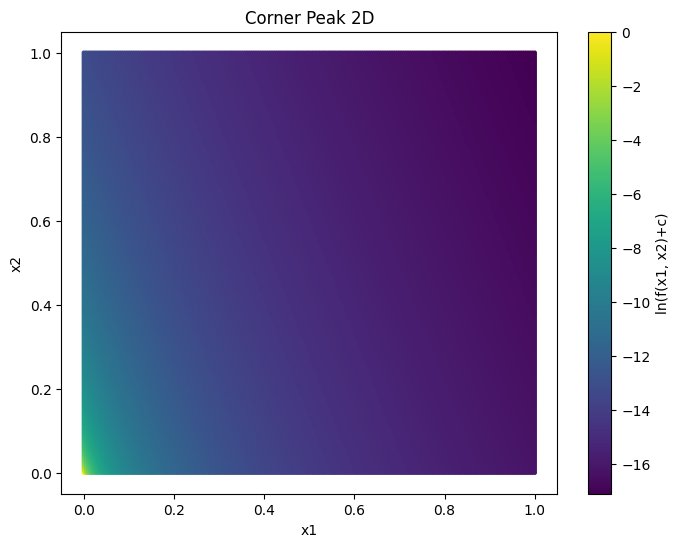

Training done! Time elapsed: 94.30 seconds
Test Loss: 0.0000075572
2D Integration started!
Iteration 3 is running!


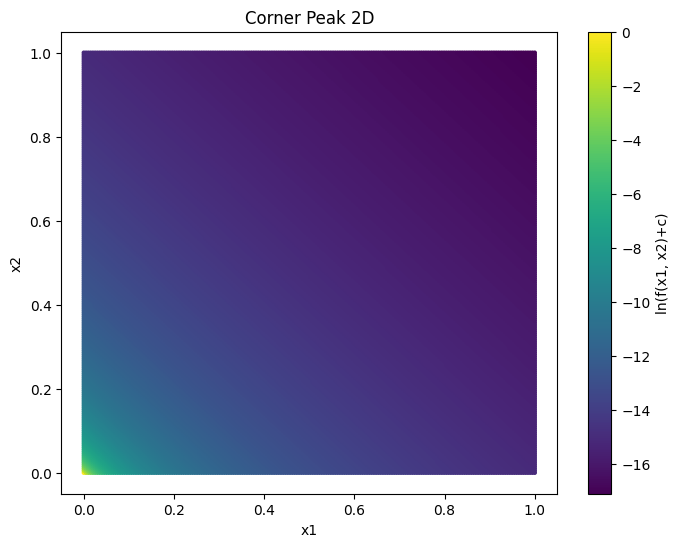

Training done! Time elapsed: 97.42 seconds
Test Loss: 0.0000091535
2D Integration started!
Iteration 4 is running!


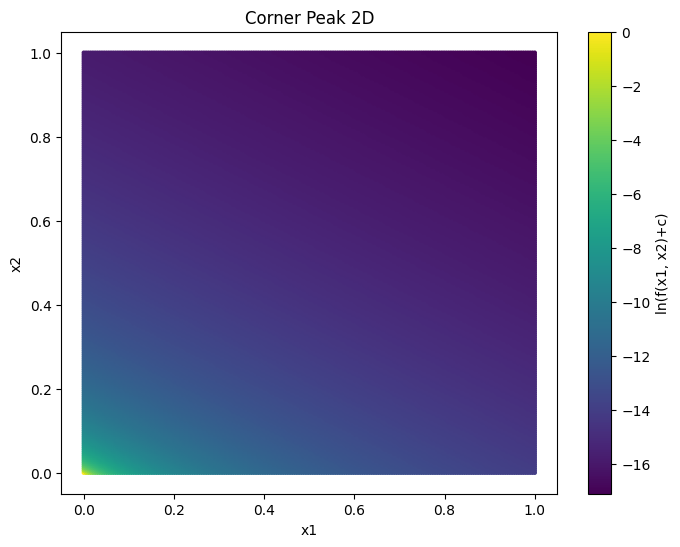

Training done! Time elapsed: 94.72 seconds
Test Loss: 0.0000001984
2D Integration started!
Iteration 5 is running!


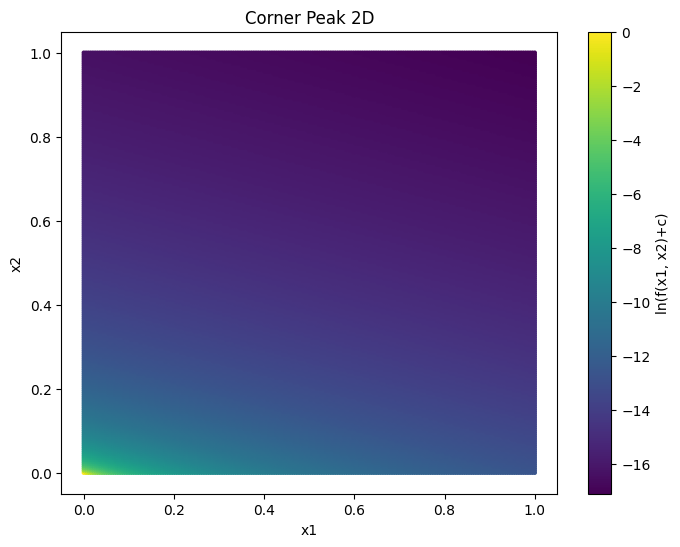

Training done! Time elapsed: 95.06 seconds
Test Loss: 0.0000011713
2D Integration started!


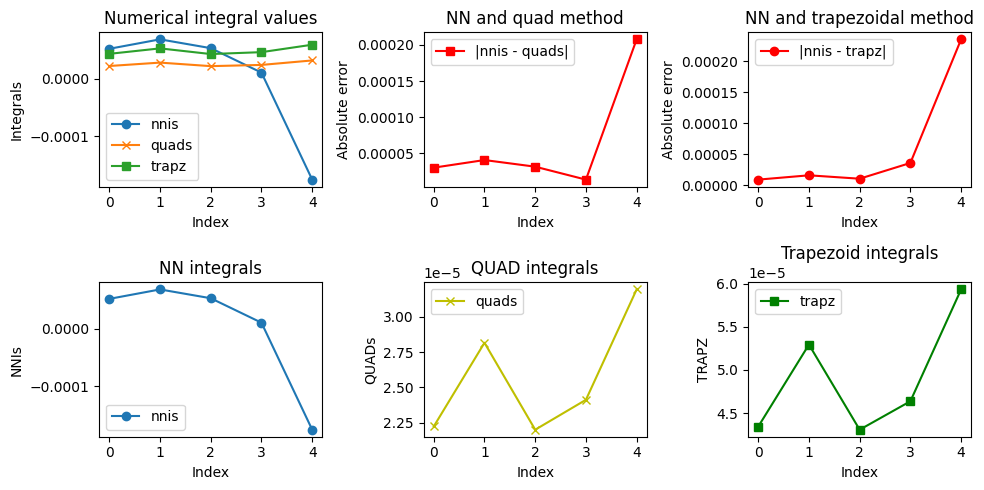

In [63]:
func_name = 'Corner Peak 2D'
h = 600
ej = 1
results9 = []

def corn_peek_2d(X, u, c):
    sum_ = 0
    for i in range(2):
        sum_ += c[i] * X[:, i]
    return (1 + sum_) ** (-3)

def corn_peek_2d_float(X, u, c):
    sum_ = 0
    for i in range(2):
        sum_ += c[i] * X[i]
    return (1 + sum_) ** (-3)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results9.append(test_2d_integration(h, ej, corn_peek_2d, corn_peek_2d_float, a, b, func_name, logplot=True))

plot_test_results(results9)

In [64]:
mae9 = calculate_mae(results9)
mae9

6.460229030106536e-05

## 10. Gaussian 2D

Iteration 1 is running!


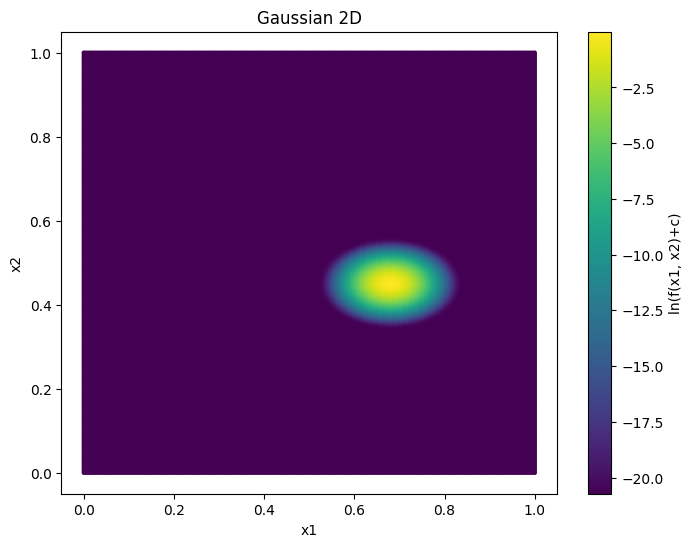

Training done! Time elapsed: 93.97 seconds
Test Loss: 0.0012805350
2D Integration started!
Iteration 2 is running!


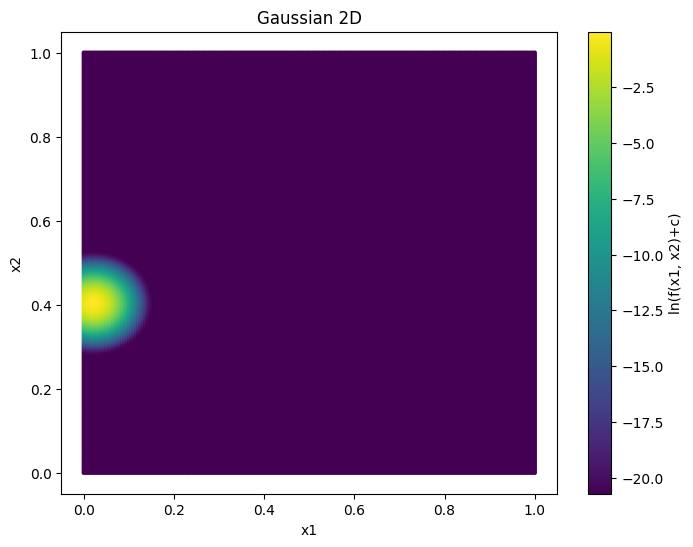

Training done! Time elapsed: 93.38 seconds
Test Loss: 0.0013857990
2D Integration started!
Iteration 3 is running!


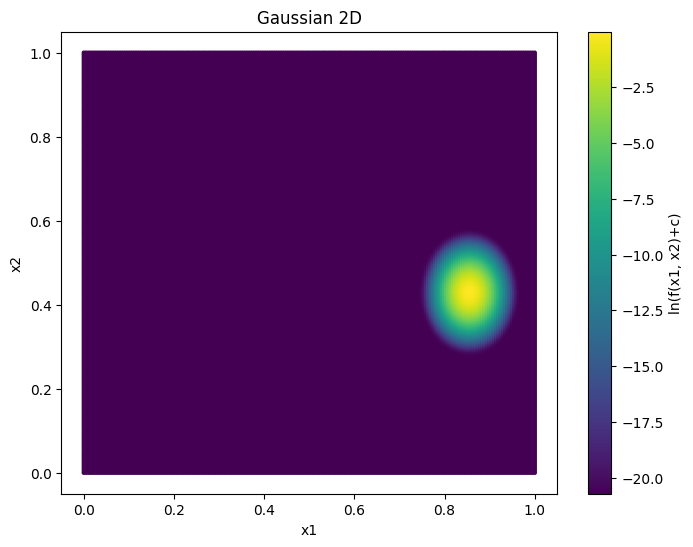

Training done! Time elapsed: 94.98 seconds
Test Loss: 0.0017008777
2D Integration started!


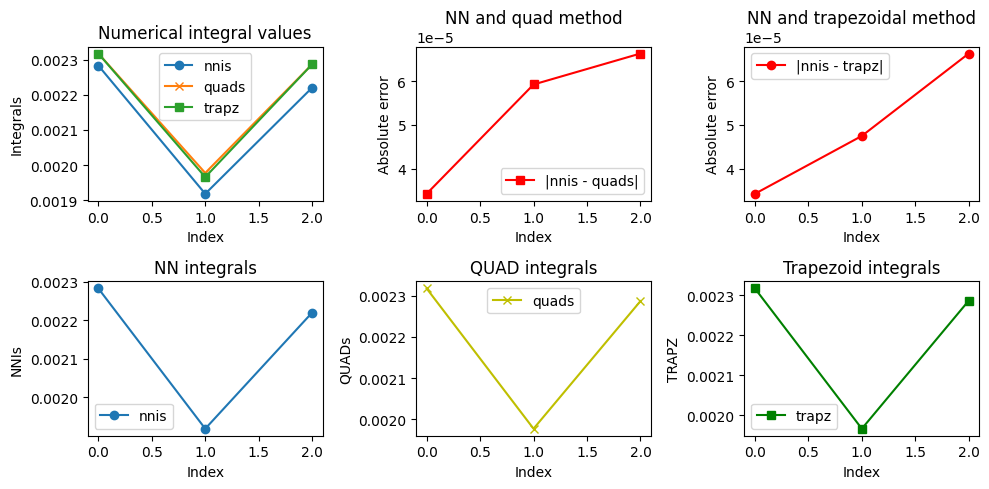

In [65]:
func_name = 'Gaussian 2D'
h = 150
ej = 1
results10 = []

def gauss_2d(X, u, c):
    sum_ = 0
    for i in range(2):
        sum_ += (c[i] ** 2) * ((X[:, i] - u[i]) ** 2)
    return torch.exp(-sum_)

def gauss_2d_float(X, u, c):
    sum_ = 0
    for i in range(2):
        sum_ += (c[i] ** 2) * ((X[i] - u[i]) ** 2)
    return np.exp(-sum_)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results10.append(test_2d_integration(h, ej, gauss_2d, gauss_2d_float, a, b, func_name, logplot=True))

plot_test_results(results10)

## 11. Continuous 2D

Iteration 1 is running!


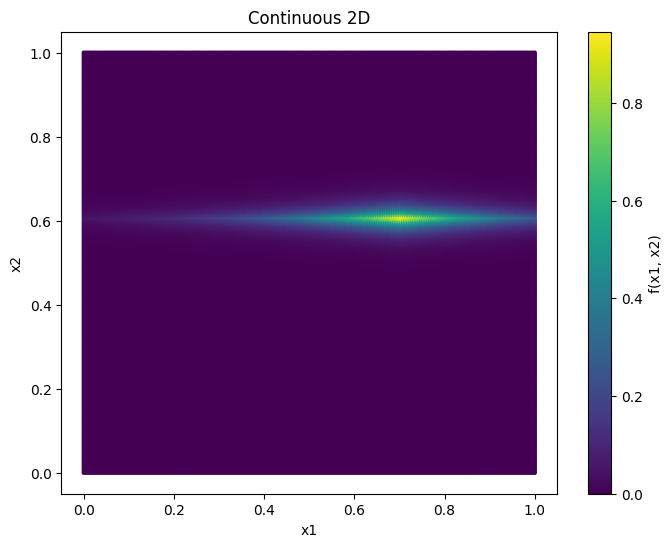

Training done! Time elapsed: 93.74 seconds
Test Loss: 0.0051083537
2D Integration started!
Iteration 2 is running!


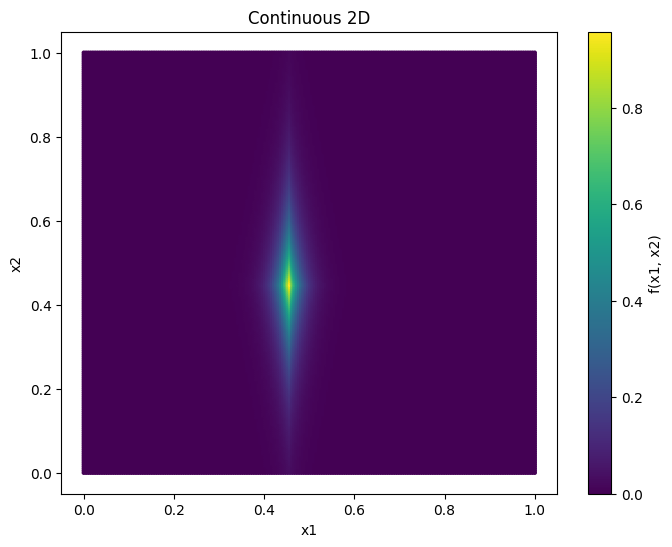

Training done! Time elapsed: 94.40 seconds
Test Loss: 0.0025607930
2D Integration started!
Iteration 3 is running!


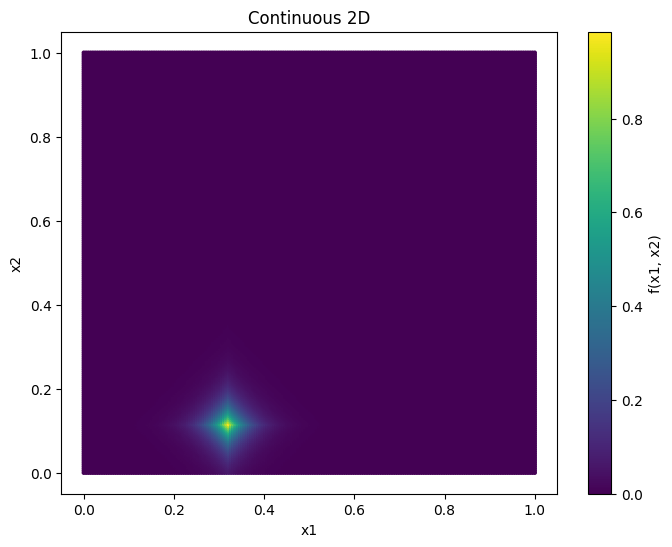

Training done! Time elapsed: 98.60 seconds
Test Loss: 0.0011975212
2D Integration started!


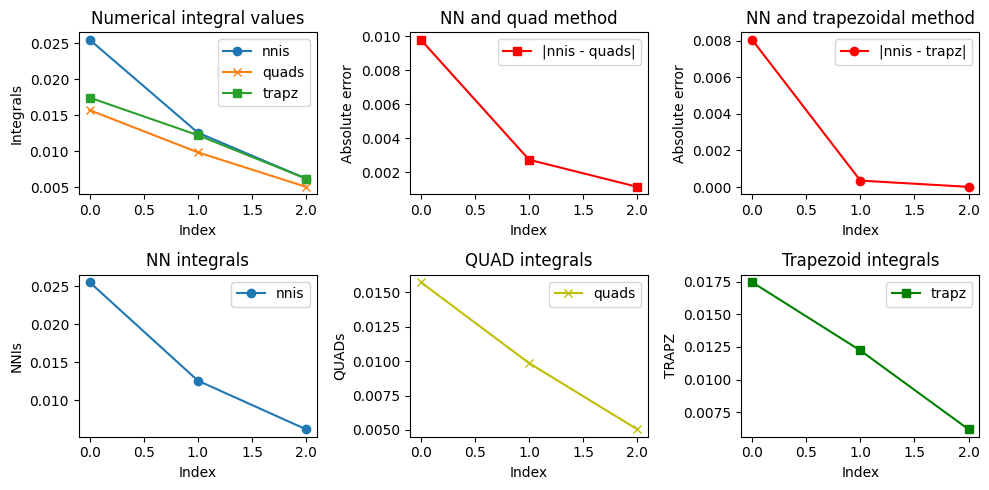

In [67]:
func_name = 'Continuous 2D'
h = 100
ej = 1
results11 = []

def cont_2d(X, u, c):
    sum_ = 0
    for i in range(2):
        sum_ += c[i]  * abs(X[:, i] - u[i])
    return torch.exp(-sum_)

def cont_2d_float(X, u, c):
    sum_ = 0
    for i in range(2):
        sum_ += c[i] ** 2 * abs(X[i] - u[i]) ** 2
    return np.exp(-sum_)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results11.append(test_2d_integration(h, ej, cont_2d, cont_2d_float, a, b, func_name, logplot=False))

plot_test_results(results11)

## 12. Discontinuous 2D

Iteration 1 is running!


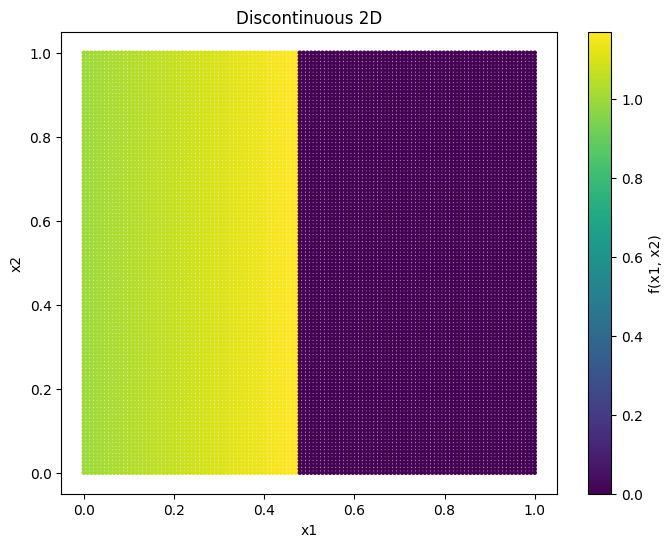

Training done! Time elapsed: 37.65 seconds
Test Loss: 0.0586425252
Iteration 2 is running!


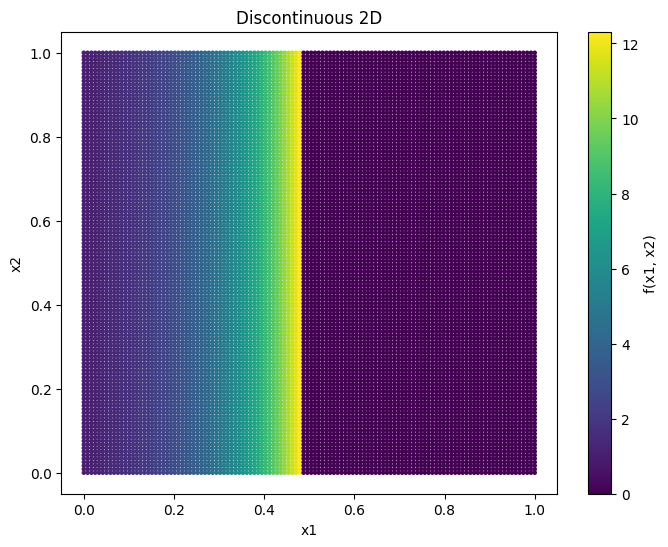

Training done! Time elapsed: 37.70 seconds
Test Loss: 0.0421462730
Iteration 3 is running!


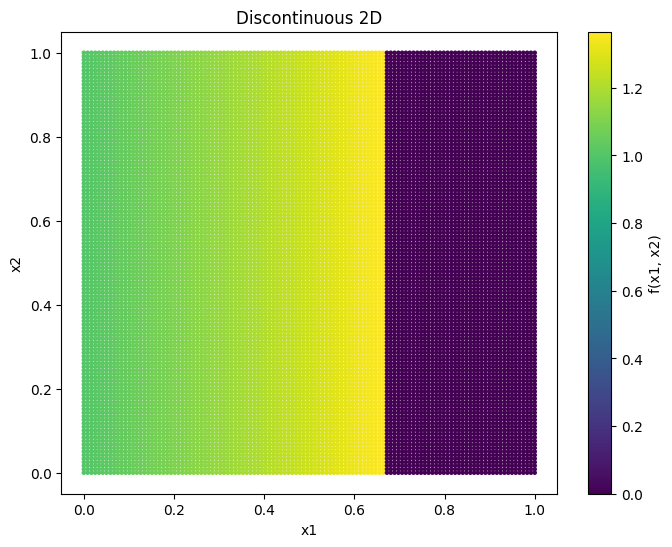

Training done! Time elapsed: 37.83 seconds
Test Loss: 0.0376445279


/usr/local/lib/python3.11/site-packages/scipy/integrate/_quadpack_py.py:1233: IntegrationWarning: The algorithm does not converge.  Roundoff error is detected
  in the extrapolation table.  It is assumed that the requested tolerance
  cannot be achieved, and that the returned result (if full_output = 1) is 
  the best which can be obtained.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


Iteration 4 is running!


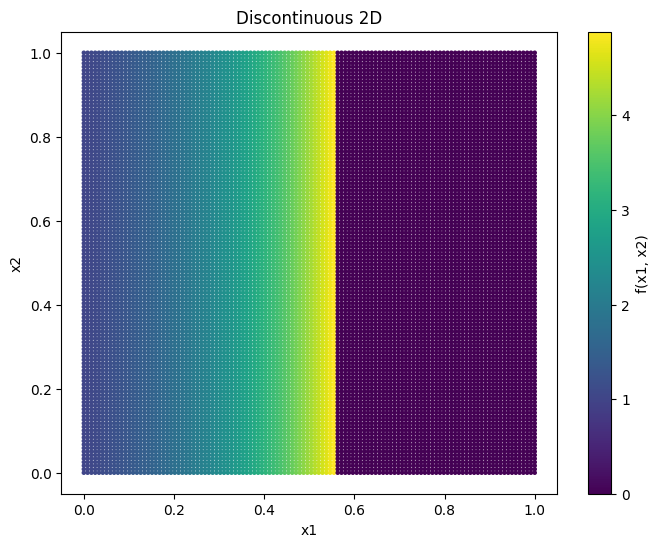

Training done! Time elapsed: 37.75 seconds
Test Loss: 0.0318653993
Iteration 5 is running!


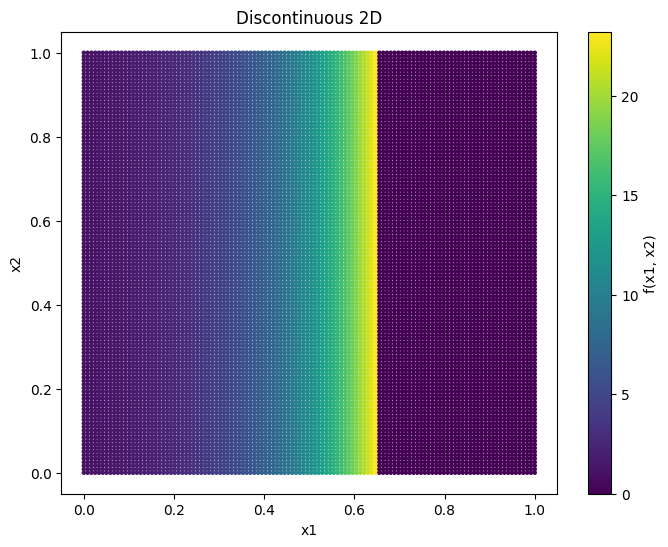

Training done! Time elapsed: 38.07 seconds
Test Loss: 0.0322972052
Iteration 6 is running!


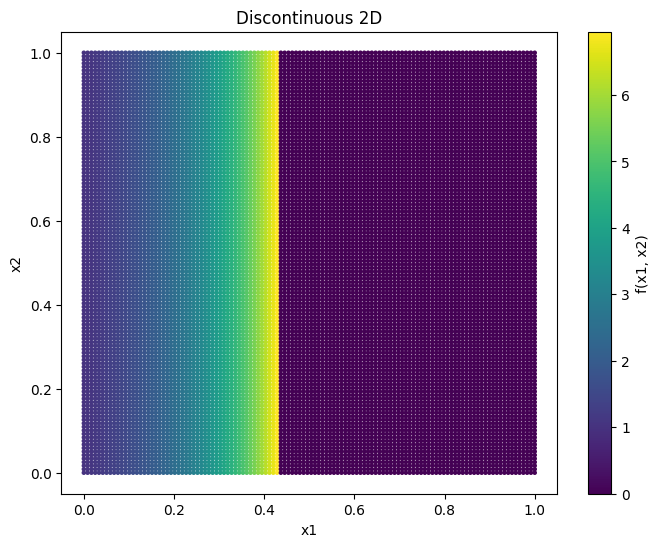

Training done! Time elapsed: 37.84 seconds
Test Loss: 0.0296891369
Iteration 7 is running!


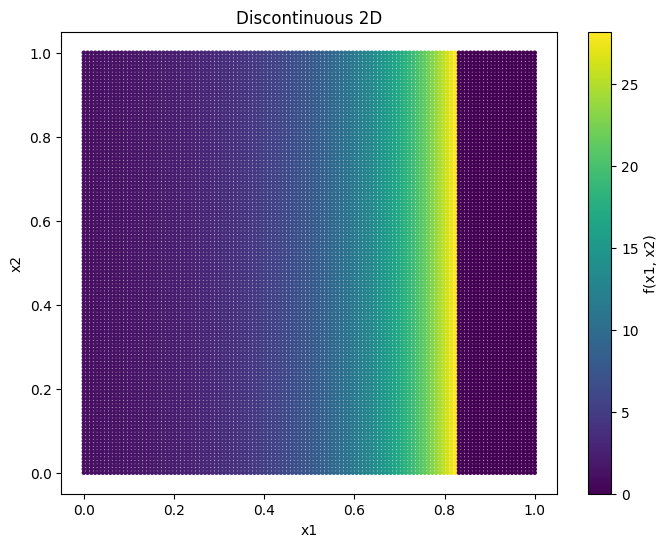

Training done! Time elapsed: 38.16 seconds
Test Loss: 0.0252247490
Iteration 8 is running!


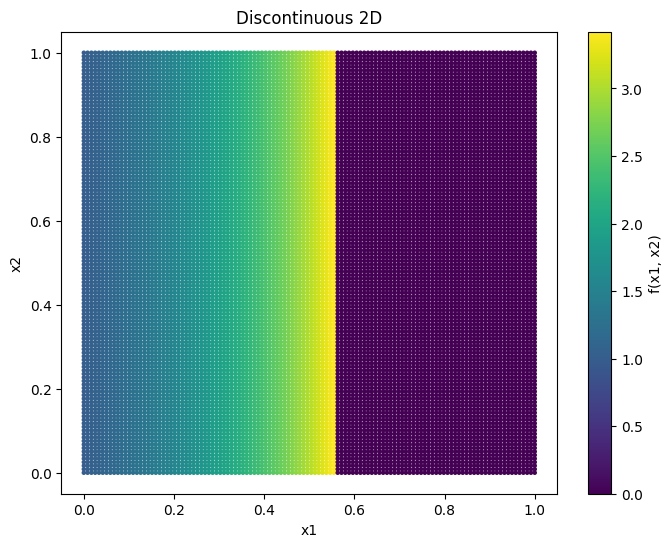

Training done! Time elapsed: 37.92 seconds
Test Loss: 0.0343667157
Iteration 9 is running!


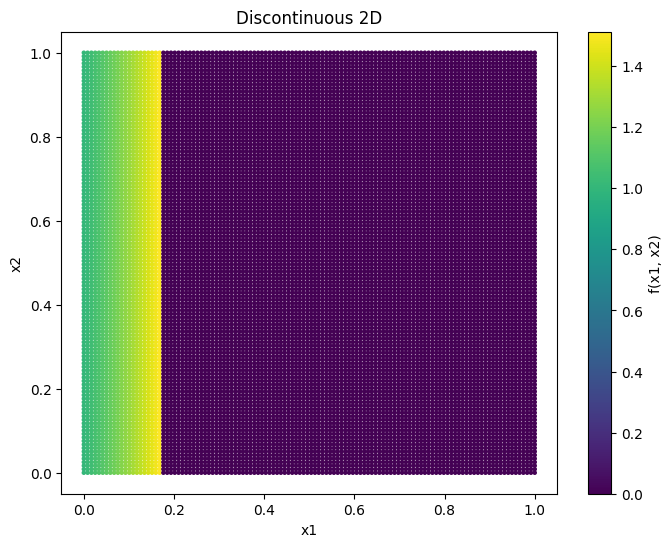

Training done! Time elapsed: 38.00 seconds
Test Loss: 0.0258271135
Iteration 10 is running!


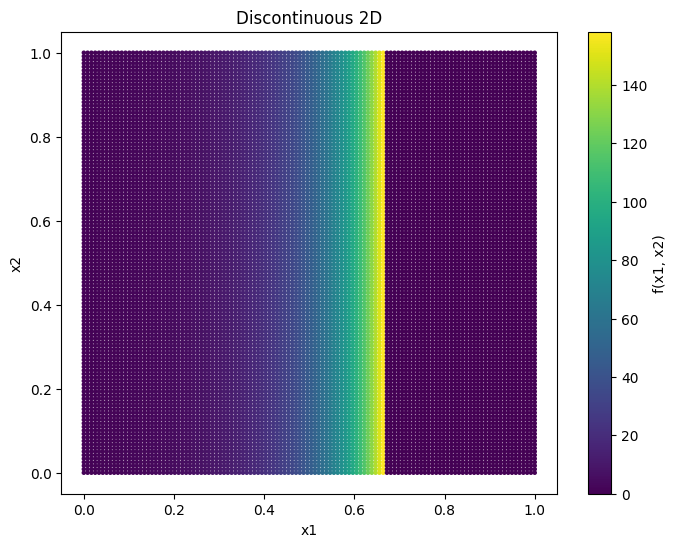

Training done! Time elapsed: 38.32 seconds
Test Loss: 0.0269000959


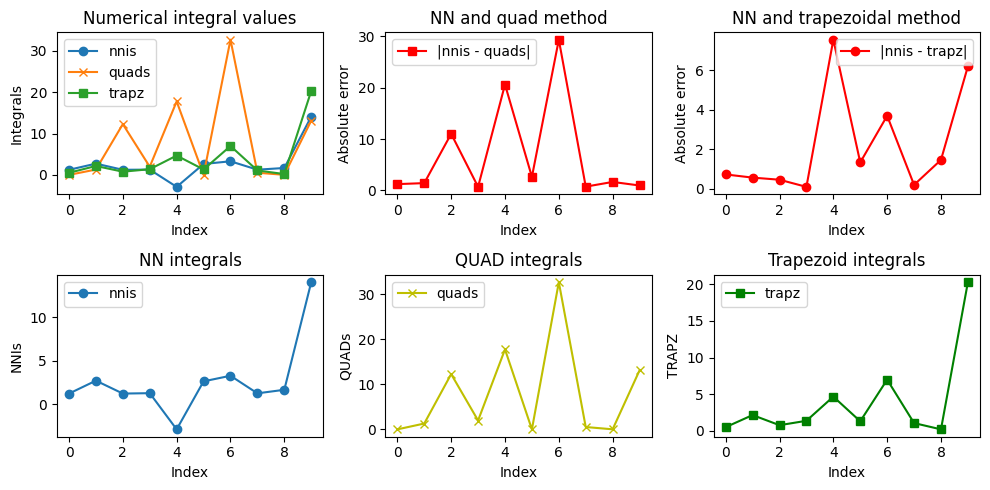

In [17]:
func_name = 'Discontinuous 2D'
h = 16
ej = 1
results12 = []

def disco_2d(X, u, c):
    result = torch.zeros(X.shape[0])
    for i in range(X.shape[0]):
        x = X[i, 0].item()
        
        if x > u[0]:
            result[i] = 0.0
        else:
            result[i] = math.exp(c[0] * x)

    return result

def disco_1d_float(X, u, c):
    x1, x2 = X

    if x1 > u[0] or x2 > u[1]:
        return 0.0
    else:
        return math.exp(c[0] * x1 + c[1] * x2)

for i in range(tests_num):
    print(f"\033[1mIteration {i+1} is running!\033[0m")
    results12.append(test_2d_integration(h, ej, disco_2d, disco_1d_float, a, b, func_name, logplot=False))

plot_test_results(results12)

# Calculation of MAEs for the research

In [107]:
results_list = [results, results2, results3, results4, results5, results6, results7, results8, results9, results10, results11, results12]
maes = [calculate_mae(results) for results in results_list]

NameError: name 'results4' is not defined

In [25]:
for i, mae in enumerate(maes, start=1):
    print(f"{mae:.8f}")

0.00184875
7.43564778
0.00007708
0.00024490
0.00016975
169.89228536
0.06622390
24772.48368776
0.02001723
0.02448823
0.03483976
7.02721075
